In [1]:
%load_ext autoreload
%autoreload 2

import os
os.environ['OMP_NUM_THREADS'] = "64"

# file ops
from pathlib import Path
from tqdm.auto import tqdm
import warnings
warnings.filterwarnings(action="ignore", category=RuntimeWarning)

# spatial
import xarray as xa
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import rioxarray
import cartopy.crs as ccrs

# machine learning
from dask.distributed import get_client, Client, LocalCluster, SSHCluster
from concurrent.futures import ThreadPoolExecutor
import xgboost as xgb

# custom
from coralshift.utils import file_ops, config, utils
from coralshift.utils.config import Config
from coralshift.dataloading import get_data
from coralshift.plotting import spatial_plots, visualise_results
from coralshift.machine_learning import static_models, run_model, ml_results
from coralshift.processing import ml_processing
from coralshift.processing import spatial_data

from tqdm.auto import tqdm
import cmipper
import cmipper.utils as cmipper_utils

# data fps
gt_data_dir = config.gt_data_dir
config_info = file_ops.read_yaml(config.config_dir / "config_test.yaml")
config_class = Config(config_info)

/maps/rt582/miniforge3/envs/shiftpy/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# To do: make up what I lost
- Re-run testing with lat-lon – don't actually need to do this, since I have the results saved
    - Would need to redo presentation format graph
- Residual investigation


## Residual investigation

In [ ]:
# load gt
# gt_ds = get_data.ReturnRaster(config_info=config_class).return_raster(dataset="unep")

# load desired predictions
pred_fp = "/maps/rt582/coralshift/runs/checkerboard_test_cell_investigation/lat_lon/combined_ccheckerboard_test_predictions_lat_lon_0-5.parquet"
preds = pd.read_parquet(pred_fp).clip(0,1)

# spatially reform predictions
preds_ds = spatial_data.spatially_reform_data(preds["prediction"], resolution=0.01)
# match with gt
interped_preds_ds = preds_ds.interp_like(gt_ds)
combined_preds_gt = xa.merge([interped_preds_ds, gt_ds])
# mask gt
combined_preds_gt["UNEP_GDCR"] = combined_preds_gt["UNEP_GDCR"].where(~np.isnan(combined_preds_gt["prediction"]))

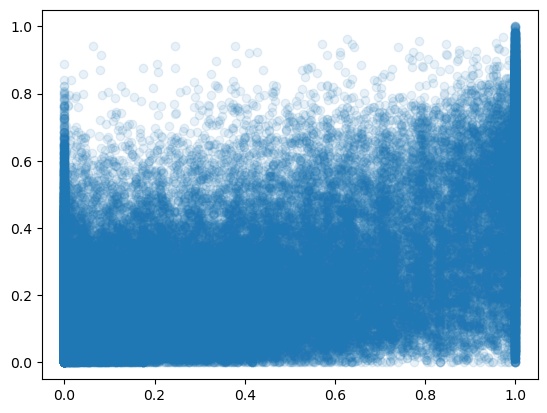

In [108]:
gt_vals = combined_preds_gt["UNEP_GDCR"].values.flatten()
pred_vals = combined_preds_gt["prediction"].values.flatten()

gt_vals = gt_vals[~np.isnan(gt_vals)]
pred_vals = pred_vals[~np.isnan(pred_vals)]
# plot scatter
plt.scatter(gt_vals, pred_vals, alpha=0.1)

(<Figure size 3000x3000 with 2 Axes>,
 <GeoAxes: title={'center': 'UNEP_GDCR at 0.0100° (~1085 m) resolution'}, xlabel='longitude [degrees_east]', ylabel='latitude [degrees_north]'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7f232118e120>)

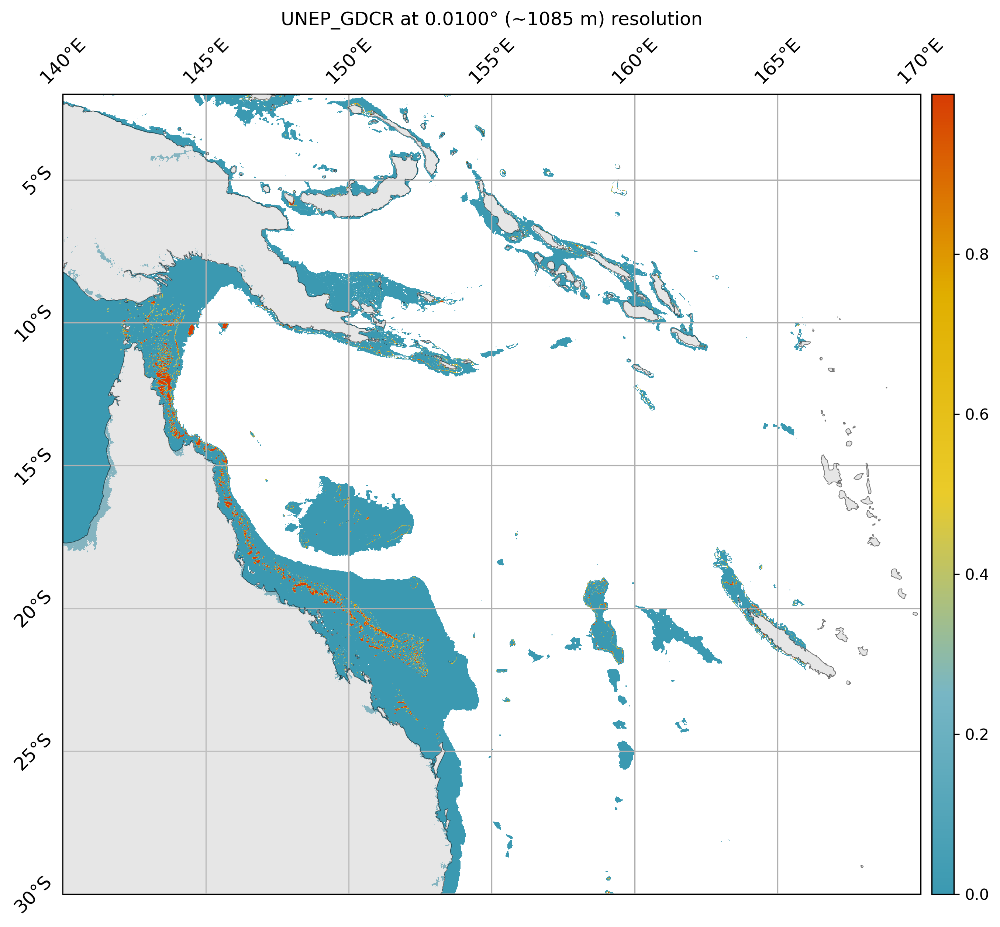

In [121]:
# plot spatial
spatial_plots.plot_spatial(combined_preds_gt["UNEP_GDCR"])

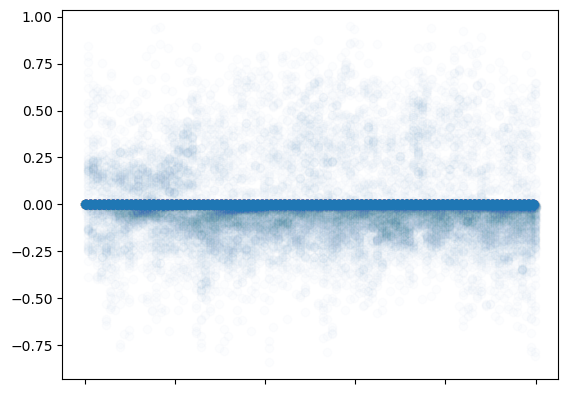

In [123]:
# visualise residuals
lim_res_lats = [-13,-12]
lim_res_lons = [140,145]

lim_res_lats = [-12,-11]
lim_res_lons = [140,145]
lim_res_data = combined_preds_gt.sel(latitude=slice(*lim_res_lats), longitude=slice(*lim_res_lons))

residuals = lim_res_data["UNEP_GDCR"] - lim_res_data["prediction"]
plt.scatter(np.arange(len(residuals.values.flatten())), residuals.values.flatten(), alpha=0.01)
plt.gca().set_xticklabels([]);

# XGBoost results from different splitting methods

In [2]:
test_cell_size = 0.05
config_class.resolution = 0.01
gt = config_class.predictand
test_train_ratio = config_class.train_test_val_frac[1]
lat_shifts = np.arange(0, 2*test_cell_size, 2*buffer) 
lon_shifts = np.arange(0, test_cell_size, 2*buffer)
# get all processed data
(trains, tests, vals), ds_info = ml_processing.ProcessMLData(config_info=config_class).generate_ml_ready_data()
# recombine trains and tests to get full dataset
all_df = pd.concat(
    [pd.concat([trains[0], trains[1].rename(gt)], axis=1), pd.concat([tests[0], tests[1].rename(gt)], axis=1)])


Searching for correct CMIP files in: /maps-priv/maps/rt582/coralshift/data/env_vars/cmip6/EC-Earth3P-HR/r1i1p2f1/regridded
	calculating statistics for static ML model(s)...


calculating statistics for variables: 100%|██████████| 9/9 [00:03<00:00,  2.81it/s]


	applying spatial buffering...
360 raster(s) to spatially buffer...


Buffering variables: 100%|██████████| 360/360 [00:26<00:00, 13.45it/s]


	resampling dataset to 0.01 degree(s) resolution...

Resampling pipeline: written raster CRS to EPSG:4326
Loading UNEP_GDCR xarray at 0.004 degrees resolution.
loading from /maps-priv/maps/rt582/coralshift/data/ground_truth/UNEP_GDCR/rasters/unep_0-004_S90-1_N90-1_W180-1_E180-1.nc
	applying spatial buffering...
1 raster(s) to spatially buffer...


Buffering variables: 100%|██████████| 1/1 [00:00<00:00, 11.63it/s]


	resampling dataset to 0.01 degree(s) resolution...

Resampling pipeline: written raster CRS to EPSG:4326
Loading gebco elevation xarray across [-31, -1] latitudes & [139, 167] longitudes from /maps-priv/maps/rt582/coralshift/data/bathymetry/gebco/GEBCO_2023_n90-0_s90-0_w180-0_e180-0.nc.
	applying spatial buffering...
1 raster(s) to spatially buffer...


Buffering variables: 100%|██████████| 1/1 [00:00<00:00,  9.34it/s]

Transposing filled array to match the original shape.


	resampling dataset to 0.01 degree(s) resolution...

Resampling pipeline: written raster CRS to EPSG:4326
Loading gebco elevation xarray across [-31, -1] latitudes & [139, 167] longitudes from /maps-priv/maps/rt582/coralshift/data/bathymetry/gebco/GEBCO_2023_n90-0_s90-0_w180-0_e180-0.nc.
calculating slopes from bathymetry...
	applying spatial buffering...
1 raster(s) to spatially buffer...


Buffering variables: 100%|██████████| 1/1 [00:08<00:00,  8.80s/it]

Transposing filled array to match the original shape.


	resampling dataset to 0.01 degree(s) resolution...

Resampling pipeline: written raster CRS to EPSG:4326
	fitting scaler to X data...
	fitting scaler to y data...

	transforming data...


In [ ]:
# save df to parquet
# all_df.to_parquet(config.data_dir / "ml_ready/tmp_all_df.parquet")



## Custom checkerboard

checkerboard splitting train-test...: 100%|██████████| 24/24 [00:00<00:00, 1315.96it/s]


(<Figure size 2000x1000 with 4 Axes>,
 <GeoAxes: title={'center': 'UNEP_GDCR at 0.0100° (~1085 m) resolution'}, xlabel='longitude', ylabel='latitude'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7a3e4150cb00>)

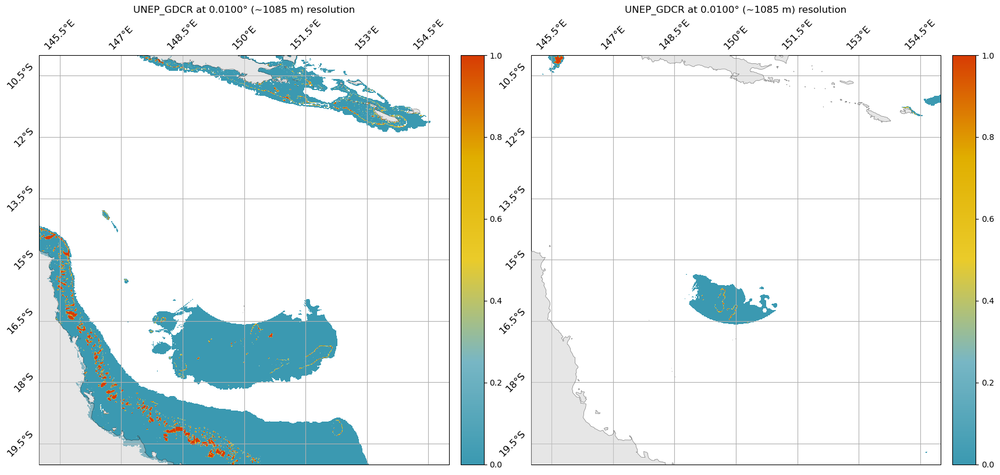

In [42]:
import numpy as np
import pandas as pd
from tqdm import tqdm

# read from parquet
all_df = pd.read_parquet(config.data_dir / "ml_ready/tmp_all_df.parquet")
test_cell_size = 5
config_class.resolution = 0.01
gt = config_class.predictand
test_train_ratio = config_class.train_test_val_frac[1]

from scipy.spatial import cKDTree

def get_checkerboard_train_test_data_kdtree(df, test_cell_size: float = 1, test_train_ratio: float = 0.2, initialisation: tuple[float] = (0,0)):
    # calculate necessary buffer for train-test ratio
    buffer = ml_processing.calculate_test_cell_buffer(test_cell_size, test_train_ratio)

    # get min and max lat/lon values from df
    extremes = utils.get_multiindex_min_max(df)
    lat_min, lat_max = extremes['latitude']['min'], extremes['latitude']['max']
    lon_min, lon_max = extremes['longitude']['min'], extremes['longitude']['max']

    # Create a meshgrid of the lat/lon centers
    lat_centres = np.arange(lat_min - initialisation[0], lat_max + test_cell_size, test_cell_size)
    lon_centres = np.arange(lon_min - initialisation[1], lon_max + test_cell_size, test_cell_size)

    # Create a meshgrid of latitudes and longitudes
    lon_grid, lat_grid = np.meshgrid(lon_centres, lat_centres)

    # Create index grids for latitudes and longitudes
    idx_grid = np.arange(lon_grid.shape[1])
    idy_grid = np.arange(lat_grid.shape[0])

    # Use broadcasting to create a full grid of index pairs
    idx_grid, idy_grid = np.meshgrid(idx_grid, idy_grid)

    # Apply the condition to select valid points
    mask = ((idy_grid % 2 == 0) & (idx_grid % 2 == 1)) | ((idy_grid % 2 != 0) & (idx_grid % 2 != 1))
    lat_test_centers = lat_grid[mask]
    lon_test_centers = lon_grid[mask]
    
    # Define bounding boxes for the test cells
    lat_test_regions = np.vstack([lat_test_centers - buffer, lat_test_centers + buffer]).T
    lon_test_regions = np.vstack([lon_test_centers - buffer, lon_test_centers + buffer]).T

    # Create KDTree for efficient range querying
    lat_index = df.index.get_level_values('latitude').values
    lon_index = df.index.get_level_values('longitude').values
    points = np.vstack([lat_index, lon_index]).T
    tree = cKDTree(points)

    # Initialize test_mask as False for all data points
    test_mask = np.zeros(len(df), dtype=bool)

    # Query the tree for points within each test region's bounding box
    for (lat_min_val, lat_max_val), (lon_min_val, lon_max_val) in tqdm(zip(lat_test_regions, lon_test_regions), desc="checkerboard splitting train-test...", total=len(lat_test_regions)):
        in_region_idx = tree.query_ball_point(
            [(lat_min_val + lat_max_val) / 2, (lon_min_val + lon_max_val) / 2],
            max(lat_max_val - lat_min_val, lon_max_val - lon_min_val) / 2
        )
        test_mask[in_region_idx] = True

    test = df[test_mask]
    train = df[~test_mask]
    return train, test


buffer = ml_processing.calculate_test_cell_buffer(test_cell_size, test_train_ratio)
lat_shifts = np.arange(0, 2*test_cell_size, 2*buffer)
lon_shifts = np.arange(0, test_cell_size, 2*buffer)
cc_predictions = []
for i in lat_shifts[:1]:
    for j in lon_shifts[:1]:
        # vertical scan
        ctrains, ctests = get_checkerboard_train_test_data_kdtree(all_df, test_cell_size, test_train_ratio, initialisation=(0,0))

tight_lons = [145, 155]
tight_lats = [-20, -10]

fig, ax = plt.subplots(1, 2, figsize=(20, 10), subplot_kw={"projection": ccrs.PlateCarree()})
trains_reformed = spatial_data.spatially_reform_data(ctrains["UNEP_GDCR"], resolution=0.01)
tests_reformed = spatial_data.spatially_reform_data(ctests["UNEP_GDCR"], resolution=0.01)
spatial_plots.plot_spatial(trains_reformed["UNEP_GDCR"].sel(latitude=slice(*tight_lats), longitude=slice(*tight_lons)), fax=(fig, ax[0]))
spatial_plots.plot_spatial(tests_reformed["UNEP_GDCR"].sel(latitude=slice(*tight_lats), longitude=slice(*tight_lons)), fax=(fig, ax[1]))
        

# Progress
1. ~~Checking that I get same results as before (for 10º example run)~~ Yes, I do
2. ~~Implementing linear Euclidean distance weights~~ No difference, at least not with defaults

TURNS OUT THOSE ARTEFACTS ARE'T AUTOCORRELATION PERSAY – THEY MUST BE DATA ARTEFACTS/THE MODEL NOT MEANINGFULLY LEARNING

3. Including lat and lon in model
4. Confirm best parameter values from a huge cross-validation (of all data, not split) XGBoost search with all parameters
5. Investigate logarithmic

In [11]:
def calculate_proximity_weight(cell, test_cell_size):
    # Calculate the distance to the nearest boundary within the test cell
    center_distance = np.sqrt((cell.name[1] - test_cell_size / 2) ** 2 + (cell.name[0] - test_cell_size / 2) ** 2)
    # Define weight function (e.g., inverse of distance or other tapering function)
    return max(1 - (center_distance / (test_cell_size / 2)), 0.1)  # Limit minimum weight to 0.1 to avoid zero weight

ctests.apply(lambda row: calculate_proximity_weight(row, test_cell_size), axis=1)

latitude  longitude
-30.00    153.21       0.1
          153.22       0.1
          153.23       0.1
          153.24       0.1
          153.25       0.1
                      ... 
-10.01    151.12       0.1
          151.13       0.1
          151.14       0.1
          151.29       0.1
          151.30       0.1
Length: 252935, dtype: float64

In [13]:
# XGBoost parameters
params = {
    'objective': 'reg:squarederror',
    'max_depth': 31,
    'eval_metric': 'rmse',
    'colsample_bytree': 0.3
}
num_rounds = 1000

# Cell sizes to evaluate
test_cell_sizes = [
    # 0.05, 0.1, 0.25, 0.5, 1, 2.5, 5, 7.5, 
    10]
test_train_ratio = 0.2  # Adjust as needed
extra_cell_size_results = {}

def calculate_proximity_weight(cell, test_cell_size):
    # Calculate the distance to the nearest boundary within the test cell
    center_distance = np.sqrt((cell.name[1] - test_cell_size / 2) ** 2 + (cell.name[0] - test_cell_size / 2) ** 2)
    # Define weight function (e.g., inverse of distance or other tapering function)
    return max(1 - (center_distance / (test_cell_size / 2)), 0.1)  # Limit minimum weight to 0.1 to avoid zero weight


for test_cell_size in tqdm(test_cell_sizes, desc="Iterating over test cell sizes"):
    buffer = ml_processing.calculate_test_cell_buffer(test_cell_size, test_train_ratio)
    lat_shifts = np.arange(0, 2 * test_cell_size, 2 * buffer)
    lon_shifts = np.arange(0, test_cell_size, 2 * buffer)
    
    # Initialize a DataFrame to store weighted predictions and weights
    weighted_predictions = pd.Series(0, index=all_df.index, dtype=float)
    weight_sums = pd.Series(0, index=all_df.index, dtype=float)
    
    for i in lat_shifts:
        for j in lon_shifts:
            # Get train/test splits for current shift
            ctrains, ctests = get_checkerboard_train_test_data_kdtree(
                all_df, test_cell_size, test_train_ratio, initialisation=(i, j)
            )
            X_trains = ctrains.drop(columns=[gt])
            y_trains = ctrains[gt]
            X_tests = ctests.drop(columns=[gt])
            y_tests = ctests[gt]

            # Train the model
            dtrain = xgb.DMatrix(X_trains, y_trains)
            dtest = xgb.DMatrix(X_tests, y_tests)
            evals = [(dtrain, "train"), (dtest, "validation")]

            model = xgb.train(
                params=params,
                dtrain=dtrain,
                num_boost_round=num_rounds,
                evals=evals,
                verbose_eval=100,
                early_stopping_rounds=50
            )

            # Predict and get predictions as Series
            cc_preds = pd.Series(model.predict(dtest), index=ctests.index, name=gt)
            
            # Calculate distance-based weights (for example, using Euclidean distance)
            weights = ctests.apply(lambda row: calculate_proximity_weight(row, test_cell_size), axis=1)
            
            # Accumulate weighted predictions and weights
            weighted_predictions.loc[ctests.index] += cc_preds * weights
            weight_sums.loc[ctests.index] += weights

    # Calculate final weighted average predictions
    weighted_avg_predictions = weighted_predictions / weight_sums
    extra_cell_size_results[test_cell_size] = weighted_avg_predictions


checkerboard splitting train-test...: 100%|██████████| 8/8 [00:00<00:00, 709.74it/s]


[0]	train-rmse:0.11708	validation-rmse:0.12743
[50]	train-rmse:0.00030	validation-rmse:0.18791


checkerboard splitting train-test...: 100%|██████████| 10/10 [00:00<00:00, 185.73it/s]


[0]	train-rmse:0.10257	validation-rmse:0.19444
[49]	train-rmse:0.00032	validation-rmse:0.19950


checkerboard splitting train-test...: 100%|██████████| 10/10 [00:00<00:00, 366.57it/s]


[0]	train-rmse:0.12011	validation-rmse:0.12926
[50]	train-rmse:0.00032	validation-rmse:0.15855


checkerboard splitting train-test...: 100%|██████████| 12/12 [00:00<00:00, 364.90it/s]


[0]	train-rmse:0.11400	validation-rmse:0.15924
[53]	train-rmse:0.00032	validation-rmse:0.16475


checkerboard splitting train-test...: 100%|██████████| 12/12 [00:00<00:00, 553.27it/s]


[0]	train-rmse:0.11899	validation-rmse:0.14291
[49]	train-rmse:0.00034	validation-rmse:0.15986


checkerboard splitting train-test...: 100%|██████████| 15/15 [00:00<00:00, 2380.42it/s]


[0]	train-rmse:0.11521	validation-rmse:0.14679
[49]	train-rmse:0.00033	validation-rmse:0.15957


checkerboard splitting train-test...: 100%|██████████| 12/12 [00:00<00:00, 1035.31it/s]


[0]	train-rmse:0.11779	validation-rmse:0.12047
[50]	train-rmse:0.00029	validation-rmse:0.15663


checkerboard splitting train-test...: 100%|██████████| 15/15 [00:00<00:00, 859.10it/s]


[0]	train-rmse:0.10931	validation-rmse:0.16815
[49]	train-rmse:0.00032	validation-rmse:0.19976


Iterating over test cell sizes: 100%|██████████| 1/1 [53:01<00:00, 3181.16s/it]


(<Figure size 3000x3000 with 2 Axes>,
 <GeoAxes: title={'center': 'pred at 0.0100° (~1085 m) resolution'}, xlabel='longitude', ylabel='latitude'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7a3e131e3fb0>)

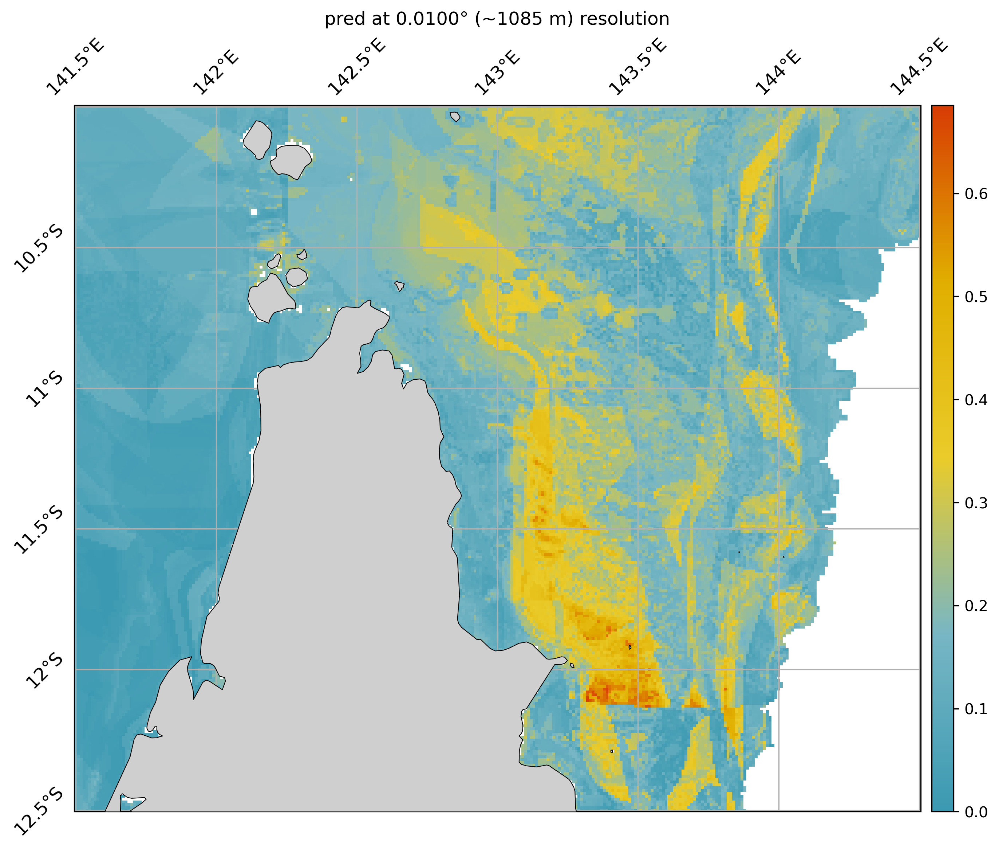

In [14]:
tight_lons = [141.5, 144.5]
tight_lats = [-12.5, -10]

out = spatial_data.spatially_reform_data(cc_combined_preds.rename("pred").to_frame().clip(0,1), resolution=0.1)
spatial_plots.plot_spatial(out["pred"].sel(latitude=slice(*tight_lats), longitude=slice(*tight_lons)))

In [49]:

# XGboost params
params = {'objective': 'reg:squarederror', 'max_depth': 31, 'eval_metric': 'rmse', 'colsample_bytree': 0.29999999999999993}
num_rounds = 1000
gt = "UNEP_GDCR"

# test_cell_sizes = [0.5, 1]
test_cell_sizes = [
    # 0.05, 0.1, 0.25, 
    0.5, 
    # 1, 2.5, 5, 7.5, 10
    ]
extra_cell_size_results = {}

for test_cell_size in tqdm(test_cell_sizes, desc="Iterating over test cell sizes"):
    # calculate necessary shifts to cover full area
    buffer = ml_processing.calculate_test_cell_buffer(test_cell_size, test_train_ratio)
    lat_shifts = np.arange(0, 2*test_cell_size, 1.1*buffer)   # TODO: do this mathematically
    lon_shifts = np.arange(0, test_cell_size, 1.1*buffer)
    
    counter = 0
    cc_predictions = []
    for i in lat_shifts:
        for j in lon_shifts:
            print(f"Run {counter} of {len(lat_shifts)*len(lon_shifts)}")
            counter += 1
            # vertical scan
            ctrains, ctests = get_checkerboard_train_test_data_kdtree(all_df, test_cell_size, test_train_ratio, initialisation=(i,j))
            # TODO: perform ML here
            X_trains = ctrains.drop(columns=[gt])
            y_trains = ctrains[gt]
            X_tests = ctests.drop(columns=[gt])
            y_tests = ctests[gt]

            dtrain = xgb.DMatrix(X_trains, y_trains)
            dtest = xgb.DMatrix(X_tests, y_tests)
            evals = [(dtrain, "train"), (dtest, "validation")]

            model = xgb.train(
                params=params,
                dtrain=dtrain,
                num_boost_round=num_rounds,
                evals=evals,
                verbose_eval=100,
                early_stopping_rounds=50
                )
            cc_preds = pd.Series(model.predict(dtest), ctests.index, name=gt)
            # TODO: overwrite rather than build this up
            cc_predictions.append(cc_preds)
            cc_combined_preds = pd.concat(cc_predictions, axis=1).mean(axis=1).rename(gt)   # rename prediction?
    extra_cell_size_results[test_cell_size] = cc_predictions

checkerboard splitting train-test...: 100%|██████████| 1510/1510 [00:00<00:00, 40855.63it/s]


[0]	train-rmse:0.11341	validation-rmse:0.14748
[62]	train-rmse:0.00031	validation-rmse:0.12247


checkerboard splitting train-test...: 100%|██████████| 1539/1539 [00:00<00:00, 40083.17it/s]


[0]	train-rmse:0.11418	validation-rmse:0.13928
[62]	train-rmse:0.00032	validation-rmse:0.11561


checkerboard splitting train-test...: 100%|██████████| 1539/1539 [00:00<00:00, 41973.04it/s]


[0]	train-rmse:0.11508	validation-rmse:0.14016
[62]	train-rmse:0.00032	validation-rmse:0.11996


checkerboard splitting train-test...: 100%|██████████| 1537/1537 [00:00<00:00, 41401.08it/s]


[0]	train-rmse:0.11308	validation-rmse:0.15106
[62]	train-rmse:0.00032	validation-rmse:0.12329


checkerboard splitting train-test...: 100%|██████████| 1566/1566 [00:00<00:00, 41585.34it/s]


[0]	train-rmse:0.11530	validation-rmse:0.13619
[62]	train-rmse:0.00032	validation-rmse:0.11652


checkerboard splitting train-test...: 100%|██████████| 1566/1566 [00:00<00:00, 42192.26it/s]


[0]	train-rmse:0.11520	validation-rmse:0.13887
[63]	train-rmse:0.00033	validation-rmse:0.12016


checkerboard splitting train-test...: 100%|██████████| 1537/1537 [00:00<00:00, 33047.69it/s]


[0]	train-rmse:0.11362	validation-rmse:0.14502
[100]	train-rmse:0.00031	validation-rmse:0.11919
[118]	train-rmse:0.00031	validation-rmse:0.11919


checkerboard splitting train-test...: 100%|██████████| 1566/1566 [00:00<00:00, 37406.49it/s]


[0]	train-rmse:0.11440	validation-rmse:0.14038
[100]	train-rmse:0.00031	validation-rmse:0.11609
[119]	train-rmse:0.00031	validation-rmse:0.11609


checkerboard splitting train-test...: 100%|██████████| 1566/1566 [00:00<00:00, 37849.45it/s]


[0]	train-rmse:0.11442	validation-rmse:0.14391
[62]	train-rmse:0.00031	validation-rmse:0.12180


checkerboard splitting train-test...: 100%|██████████| 1563/1563 [00:00<00:00, 36907.93it/s]


[0]	train-rmse:0.11509	validation-rmse:0.13848
[63]	train-rmse:0.00031	validation-rmse:0.11641


checkerboard splitting train-test...: 100%|██████████| 1593/1593 [00:00<00:00, 42282.52it/s]


[0]	train-rmse:0.11500	validation-rmse:0.13923
[58]	train-rmse:0.00031	validation-rmse:0.12135


checkerboard splitting train-test...: 100%|██████████| 1593/1593 [00:00<00:00, 41358.88it/s]


[0]	train-rmse:0.11279	validation-rmse:0.15125
[63]	train-rmse:0.00031	validation-rmse:0.12775


checkerboard splitting train-test...: 100%|██████████| 1563/1563 [00:00<00:00, 38253.30it/s]


[0]	train-rmse:0.11556	validation-rmse:0.13704
[63]	train-rmse:0.00031	validation-rmse:0.11766


checkerboard splitting train-test...: 100%|██████████| 1593/1593 [00:00<00:00, 40298.95it/s]


[0]	train-rmse:0.11362	validation-rmse:0.14289
[62]	train-rmse:0.00031	validation-rmse:0.11980


checkerboard splitting train-test...: 100%|██████████| 1593/1593 [00:00<00:00, 39786.86it/s]


[0]	train-rmse:0.11267	validation-rmse:0.15244
[63]	train-rmse:0.00031	validation-rmse:0.12559


checkerboard splitting train-test...: 100%|██████████| 1563/1563 [00:00<00:00, 40080.32it/s]


[0]	train-rmse:0.11435	validation-rmse:0.14028
[63]	train-rmse:0.00031	validation-rmse:0.11870


checkerboard splitting train-test...: 100%|██████████| 1593/1593 [00:00<00:00, 40273.69it/s]


[0]	train-rmse:0.11378	validation-rmse:0.14882
[62]	train-rmse:0.00031	validation-rmse:0.12280


checkerboard splitting train-test...: 100%|██████████| 1593/1593 [00:00<00:00, 41839.30it/s]


[0]	train-rmse:0.11309	validation-rmse:0.14817
[100]	train-rmse:0.00031	validation-rmse:0.12145
[119]	train-rmse:0.00031	validation-rmse:0.12145


Iterating over test cell sizes: 100%|██████████| 1/1 [1:02:48<00:00, 3768.27s/it]


In [ ]:
out.to_netcdf(config.data_dir / "ml_ready/checkerboard_preds_0-01_smaller_buffer.nc")

(<Figure size 3000x3000 with 2 Axes>,
 <GeoAxes: title={'center': 'pred at 0.0100° (~1085 m) resolution'}, xlabel='longitude', ylabel='latitude'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7a3e41358830>)

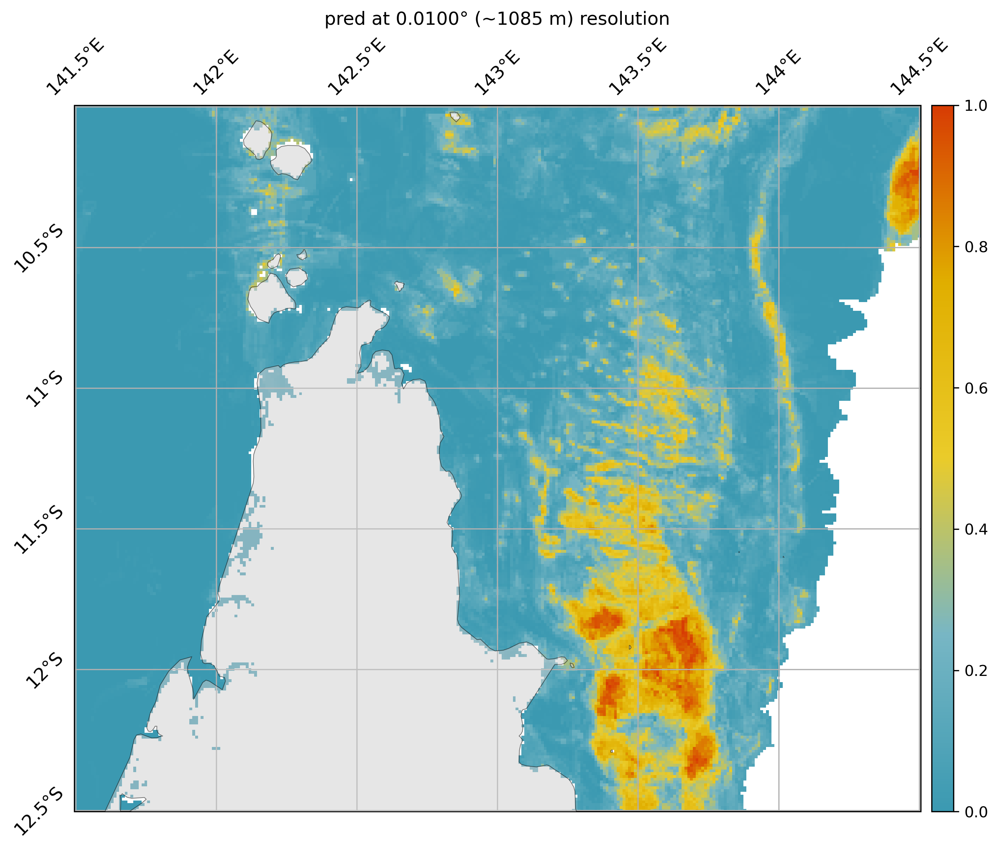

In [50]:
tight_lons = [141.5, 144.5]
tight_lats = [-12.5, -10]

out = spatial_data.spatially_reform_data(cc_combined_preds.rename("pred").to_frame().clip(0,1), resolution=0.1)
spatial_plots.plot_spatial(out["pred"].sel(latitude=slice(*tight_lats), longitude=slice(*tight_lons)))

Loading UNEP_GDCR xarray at 0.004 degrees resolution.
loading from /maps-priv/maps/rt582/coralshift/data/ground_truth/UNEP_GDCR/rasters/unep_0-004_S90-1_N90-1_W180-1_E180-1.nc


	applying spatial buffering...
1 raster(s) to spatially buffer...


Buffering variables: 100%|██████████| 1/1 [00:05<00:00,  5.31s/it]


	resampling dataset to 0.01 degree(s) resolution...

Resampling pipeline: written raster CRS to EPSG:4326


(<Figure size 3000x3000 with 2 Axes>,
 <GeoAxes: title={'center': 'UNEP_GDCR at 0.0100° (~1085 m) resolution'}, xlabel='longitude [degrees_east]', ylabel='latitude [degrees_north]'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7a3dac09b920>)

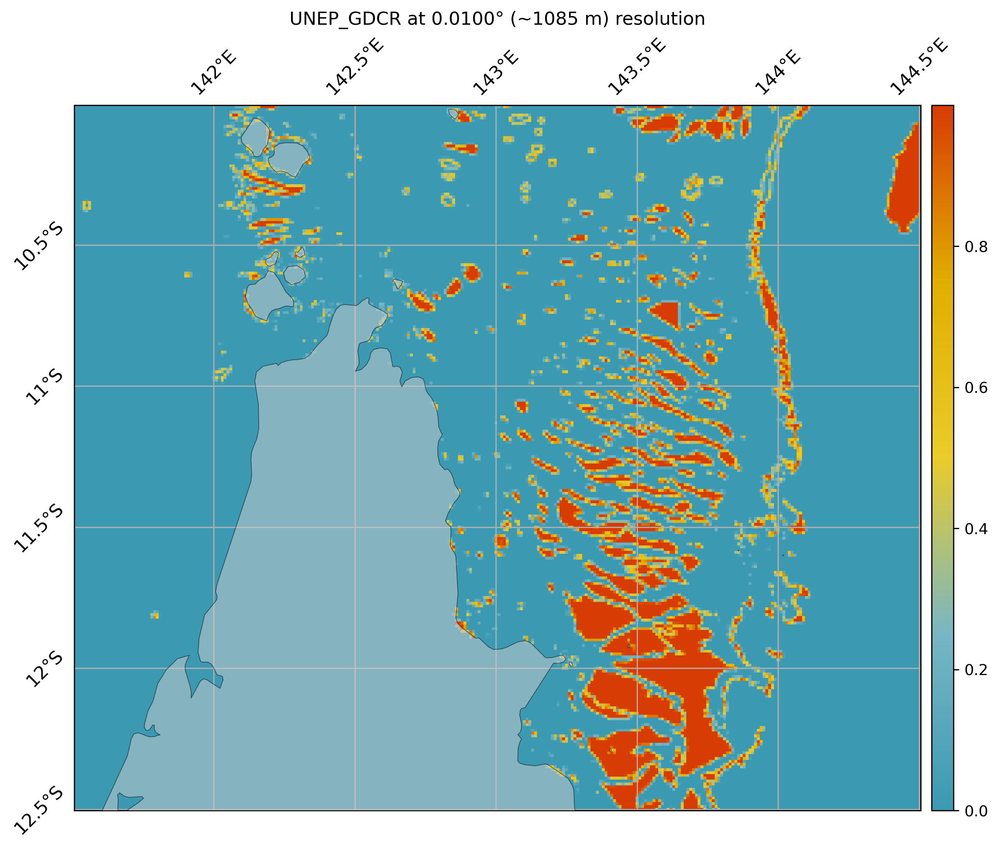

In [46]:
gt = get_data.ReturnRaster(config_info=config_class).return_raster(dataset="unep")
spatial_plots.plot_spatial(gt["UNEP_GDCR"].sel(latitude=slice(*tight_lats), longitude=slice(*tight_lons)))

(<Figure size 3000x3000 with 2 Axes>,
 <GeoAxes: title={'center': 'pred at 0.0100° (~1085 m) resolution'}, xlabel='longitude', ylabel='latitude'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7a3e43b1f410>)

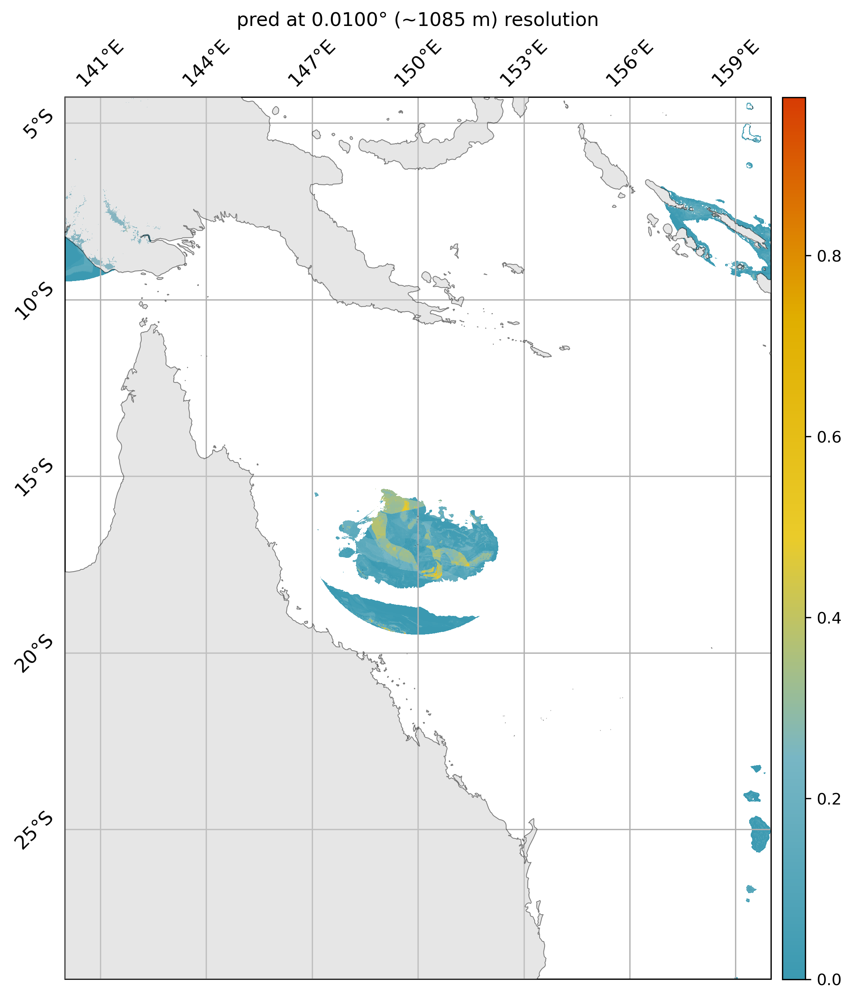

In [27]:
tight_lons = [141.5, 144.5]
tight_lats = [-12.5, -10]
tight_lons = [140, 160]
tight_lats = [-30, 0]

out = spatial_data.spatially_reform_data(cc_predictions[2].rename("pred").to_frame().clip(0,1), resolution=0.01)
spatial_plots.plot_spatial(out["pred"].sel(latitude=slice(*tight_lats), longitude=slice(*tight_lons)))

In [19]:
gt

'UNEP_GDCR'

(<Figure size 3000x3000 with 2 Axes>,
 <GeoAxes: title={'center': 'pred at 0.0100° (~1085 m) resolution'}, xlabel='longitude', ylabel='latitude'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x72ab603a1d30>)

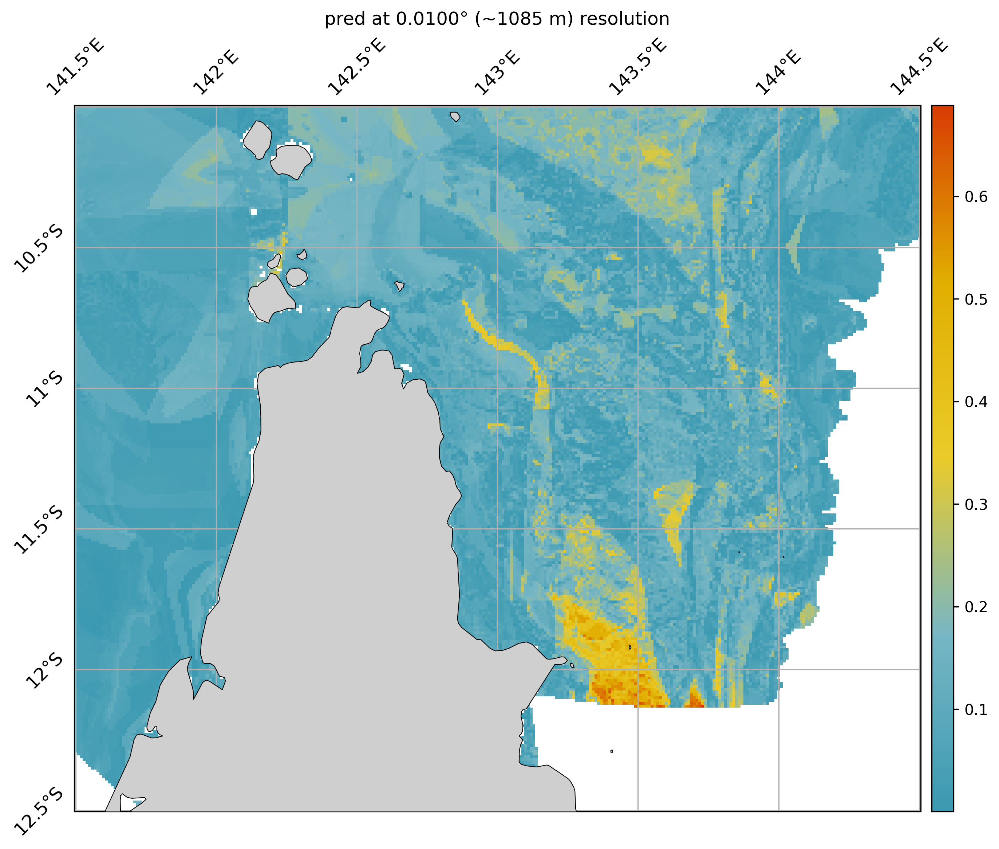

In [41]:

tight_lons = [141.5, 144.5]
tight_lats = [-12.5, -10]

out = spatial_data.spatially_reform_data(pd.concat(cc_predictions, axis=1).std(axis=1).rename("pred").to_frame().clip(0,1), resolution=0.1)
spatial_plots.plot_spatial(out["pred"].sel(latitude=slice(*tight_lats), longitude=slice(*tight_lons)))

(<Figure size 3000x3000 with 2 Axes>,
 <GeoAxes: title={'center': 'pred at 0.0100° (~1085 m) resolution'}, xlabel='longitude', ylabel='latitude'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x72ab6c1952b0>)

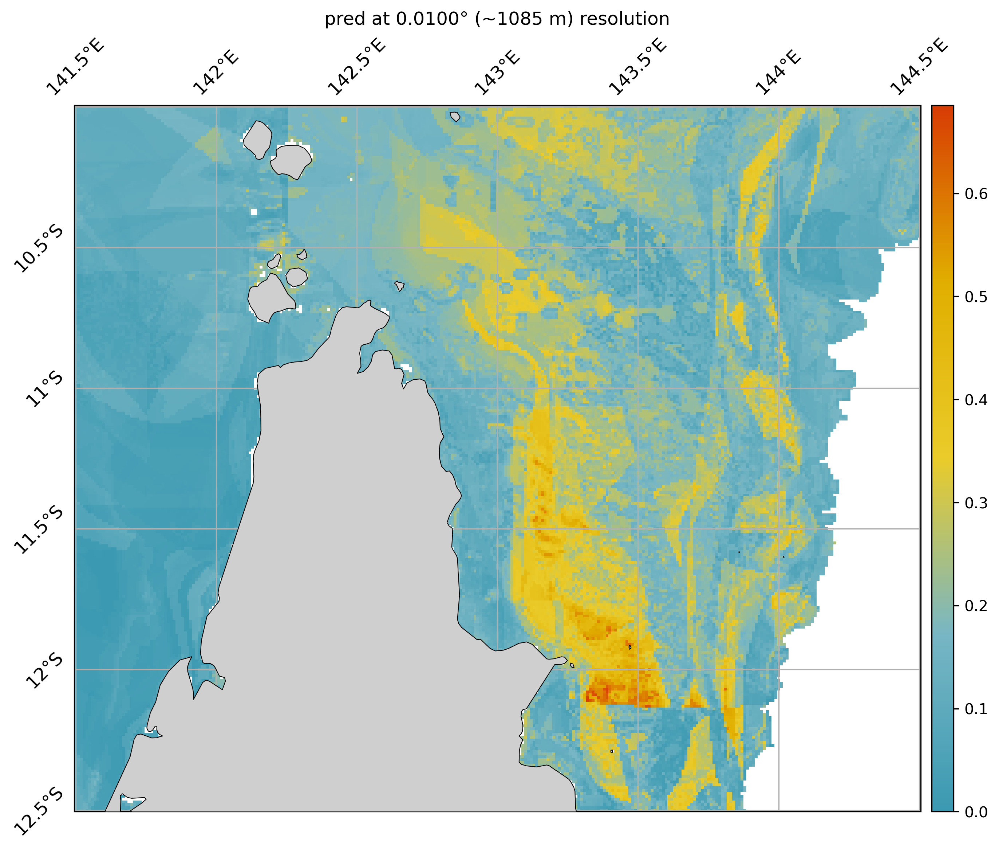

In [39]:

tight_lons = [141.5, 144.5]
tight_lats = [-12.5, -10]

out = spatial_data.spatially_reform_data(cc_combined_preds.rename("pred").to_frame().clip(0,1), resolution=0.1)
spatial_plots.plot_spatial(out["pred"].sel(latitude=slice(*tight_lats), longitude=slice(*tight_lons)))

(<Figure size 3000x3000 with 2 Axes>,
 <GeoAxes: title={'center': 'pred at 0.0100° (~1085 m) resolution'}, xlabel='longitude', ylabel='latitude'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x72ab6c16dc70>)

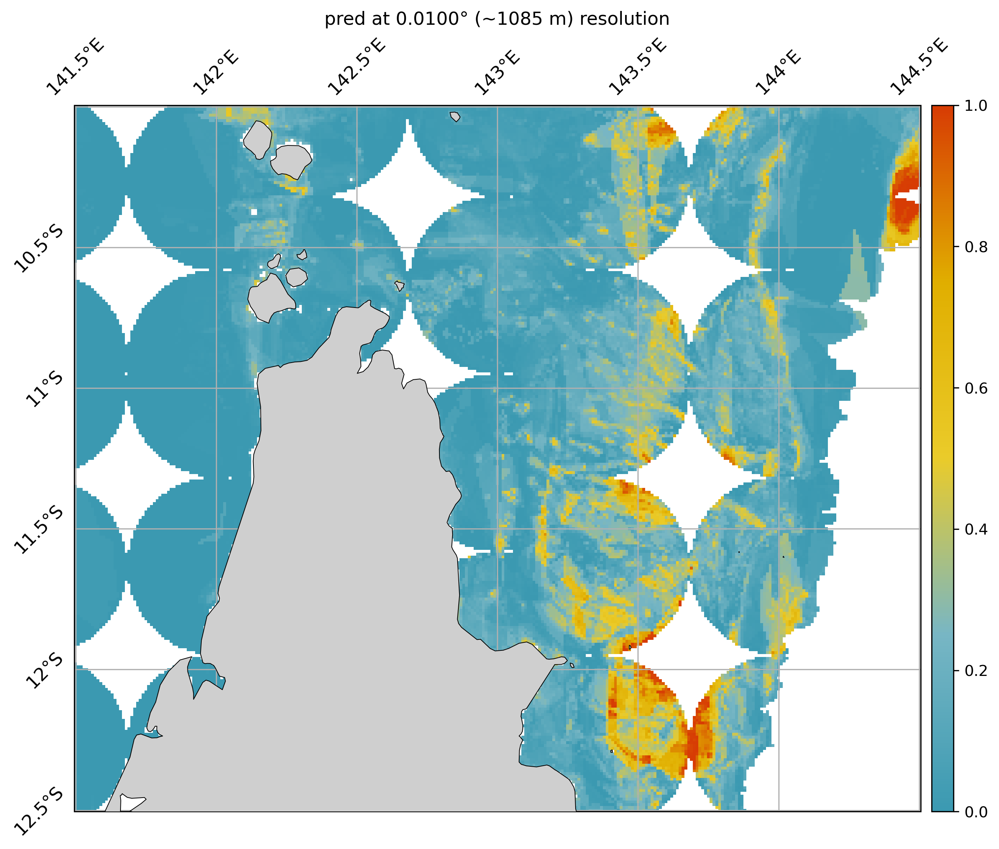

In [37]:
tight_lons = [141.5, 144.5]
tight_lats = [-12.5, -10]

out = spatial_data.spatially_reform_data(pd.concat(extra_cell_size_results[1], axis=1).mean(axis=1).rename("pred").to_frame().clip(0,1), resolution=0.1)
spatial_plots.plot_spatial(out["pred"].sel(latitude=slice(*tight_lats), longitude=slice(*tight_lons)))

In [18]:
extra_cell_size_results.keys()

dict_keys([0.05, 0.1, 0.25, 0.5, 1, 2.5, 5, 7.5, 10])

In [23]:
pd.concat(extra_cell_size_results[5], axis=1).mean(axis=1).rename("pred").to_frame().clip(0,1)

pred
latitude longitude          
-30.00   153.42     0.000001
         153.43     0.000007
         153.44     0.000020
         153.45     0.000020
         153.46     0.000006
...                      ...
-2.92    147.03     0.004075
         147.04     0.000000
-2.91    146.94     0.027594
         146.95     0.027594
-14.72   145.28     0.005910

[866760 rows x 1 columns]

In [22]:
pd.concat(extra_cell_size_results[0.05], axis=1).mean(axis=1).rename(gt)

latitude  longitude
-30.00    153.24      -0.000005
          153.25       0.000010
          153.26       0.000014
          153.34       0.007658
          153.35      -0.000002
                         ...   
-10.03    147.57       0.177137
          147.67      -0.000254
          149.97      -0.000218
          150.07      -0.000022
          150.87      -0.000590
Name: UNEP_GDCR, Length: 898425, dtype: float32

In [49]:
summary_stats = {}

combined_prediction_dss = {}
# gt = get_data.ReturnRaster(config_info=config_class).return_raster(dataset="unep") 
for test_cell_size, preds in tqdm(extra_cell_size_results.items()):
    combined_preds_df = pd.concat(preds, axis=1).mean(axis=1).rename("pred").to_frame().clip(0,1)
    combined_pred_ds = spatial_data.spatially_reform_data(combined_preds_df, resolution=config_class.resolution)
    interped_pred = combined_pred_ds.interp_like(gt)
    combined_preds_gt = xa.merge([interped_pred, gt])
    combined_preds_gt["UNEP_GDCR"] = combined_preds_gt["UNEP_GDCR"].where(~np.isnan(combined_preds_gt["pred"]))
    combined_prediction_dss[test_cell_size] = combined_preds_gt

100%|██████████| 9/9 [00:42<00:00,  4.74s/it]


In [55]:
print(len(pred_vals[~np.isnan(pred_vals)]))
print(len(gt_vals[~np.isnan(gt_vals)]))

646232
646232


In [61]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

summary_stats = {}
# determine the R2, RMSE, MAE, and slope of a regression line for each cell size
for test_cell_size, ds in tqdm(combined_prediction_dss.items()):
    pred_vals = ds["pred"].values.flatten()
    gt_vals = ds["UNEP_GDCR"].values.flatten()
    # remove nans
    pred_vals = pred_vals[~np.isnan(pred_vals)]
    gt_vals = gt_vals[~np.isnan(gt_vals)]
    
    r2 = r2_score(gt_vals, pred_vals)
    rmse = mean_squared_error(gt_vals, pred_vals)
    mae = mean_absolute_error(gt_vals, pred_vals)
    slope = np.polyfit(gt_vals, pred_vals, 1)[0]
    summary_stats[test_cell_size] = {"r2": r2, "rmse": rmse, "mae": mae, "slope": slope}

100%|██████████| 9/9 [00:00<00:00, 10.19it/s]


,0.05,0.10,0.25,0.50,1.00,2.50,5.00,7.50,10.00
r2,0.748883,0.649681,0.508556,0.401394,0.281757,0.145037,-0.038279,-0.014089,-0.295173
rmse,0.005938,0.008278,0.011611,0.014374,0.016248,0.020365,0.020666,0.024744,0.028754
mae,0.020430,0.025789,0.034213,0.041873,0.050256,0.065285,0.079299,0.096126,0.112280
slope,0.723551,0.629256,0.505791,0.418221,0.362254,0.272932,0.203807,0.213887,0.162793


In [71]:
cmap = spatial_plots.ColourMapGenerator().get_cmap("seq")
colors = cmap(np.linspace(0, 1, 4))

In [82]:
summary_df.columns.tolist()
cols = summary_df.columns.tolist()
cols[2:3]

['r2']

In [77]:
cols = .tolist()summary_df.columns
cols = cols[-1:] + cols[:-1]
summary_df = summary_df[cols]
summary_df

,slope,test_cell_size,r2,rmse,mae
0,0.723551,0.05,0.748883,0.005938,0.020430
1,0.629256,0.10,0.649681,0.008278,0.025789
2,0.505791,0.25,0.508556,0.011611,0.034213
3,0.418221,0.50,0.401394,0.014374,0.041873
4,0.362254,1.00,0.281757,0.016248,0.050256
5,0.272932,2.50,0.145037,0.020365,0.065285
6,0.203807,5.00,-0.038279,0.020666,0.079299
7,0.213887,7.50,-0.014089,0.024744,0.096126
8,0.162793,10.00,-0.295173,0.028754,0.112280


/tmp/ipykernel_1335100/2617241490.py:11: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(data=df_melted, x='test_cell_size', y='Value', hue='Statistic', palette=colors[::-1])


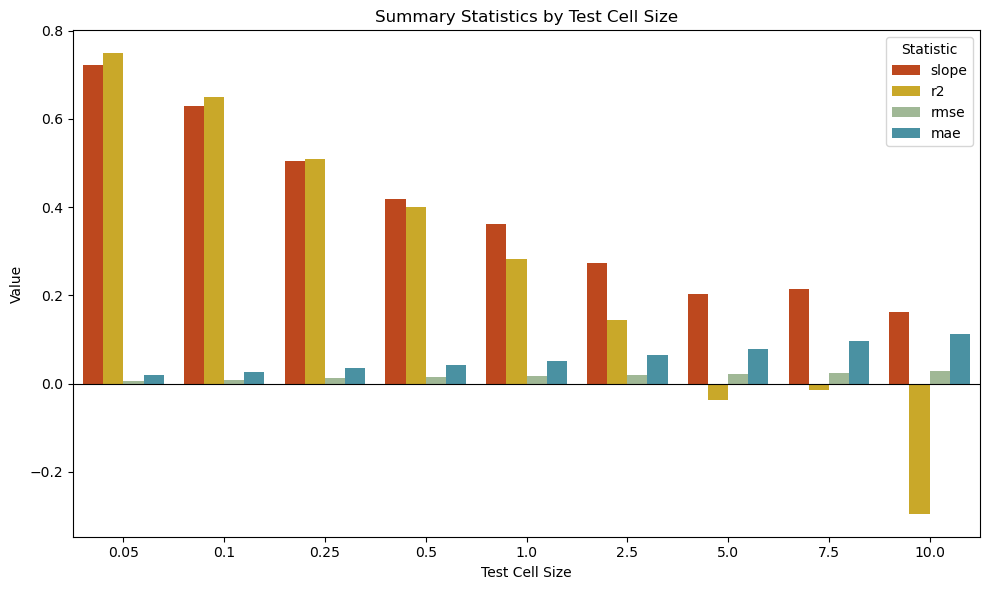

In [86]:
import seaborn as sns
# plot a barchart 
summary_df = pd.DataFrame(summary_stats).T.reset_index().rename(columns={'index': 'test_cell_size'})
summary_df = summary_df[["slope", "r2", "rmse", "mae", "test_cell_size"]]

# Melt DataFrame to long format suitable for Seaborn
df_melted = summary_df.melt(id_vars='test_cell_size', var_name='Statistic', value_name='Value')

# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(data=df_melted, x='test_cell_size', y='Value', hue='Statistic', palette=colors[::-1])

# Customize the plot
plt.axhline(y=0, color='black', linewidth=0.8)

plt.title("Summary Statistics by Test Cell Size")
plt.xlabel("Test Cell Size")
plt.ylabel("Value")
plt.legend(title="Statistic", loc='upper right')
# plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [205]:
cc_pred_df = cc_combined_preds.to_frame(name="prediction")
# threshold predictions to 0 and 1
cc_pred_df["prediction"] = cc_pred_df["prediction"].clip(0, 1)
cc_pred_ds = spatial_data.spatially_reform_data(cc_pred_df, resolution=0.1)

gt = get_data.ReturnRaster(config_info=config_class).return_raster(dataset="unep")

cc_interped_pred = cc_pred_ds.interp_like(gt)
cc_combined_preds_gt = xa.merge([cc_interped_pred, gt])
# save to parquet
# cc_pred_df.to_parquet("/maps/rt582/coralshift/data/test_data/combined_ccheckerboard_test_predictions.parquet")

Loading UNEP_GDCR xarray at 0.004 degrees resolution.
loading from /maps-priv/maps/rt582/coralshift/data/ground_truth/UNEP_GDCR/rasters/unep_0-004_S90-1_N90-1_W180-1_E180-1.nc
	applying spatial buffering...
1 raster(s) to spatially buffer...


Buffering variables: 100%|██████████| 1/1 [00:00<00:00, 11.38it/s]


	resampling dataset to 0.01 degree(s) resolution...

Resampling pipeline: written raster CRS to EPSG:4326


In [206]:
# in combined_preds_gt, make gt values nan where interped_pred is nan (give gt depth mask)
combined_preds_gt["UNEP_GDCR"] = combined_preds_gt["UNEP_GDCR"].where(~np.isnan(combined_preds_gt["prediction"]))

(<Figure size 2000x1000 with 4 Axes>,
 <GeoAxes: title={'center': 'Predicted reef density'}, xlabel='longitude [degrees_east]', ylabel='latitude [degrees_north]'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x73448cb1f2f0>)

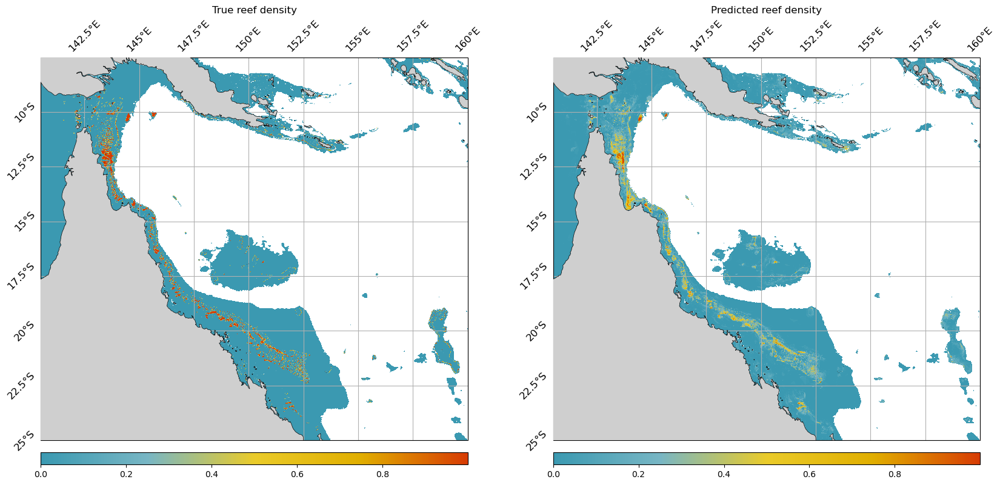

In [207]:
lats = [-25,-7.5]
lons = [140.5,160]

# plot comparison
fig, ax = plt.subplots(ncols=2, subplot_kw={"projection": ccrs.PlateCarree()}, figsize=[20,10])
# scale "prediction" between minimum and maximum of "UNEP_GDCR"
min_gt, max_gt = combined_preds_gt["UNEP_GDCR"].min(), combined_preds_gt["UNEP_GDCR"].max()
min_pred, max_pred = combined_preds_gt["prediction"].min(), combined_preds_gt["prediction"].max()
scaled_pred = (combined_preds_gt["prediction"] - min_pred) / (max_pred - min_pred) * (max_gt - min_gt) + min_gt

spatial_plots.plot_spatial(combined_preds_gt["UNEP_GDCR"].sel(latitude=slice(min(lats), max(lats)), longitude=slice(min(lons), max(lons))), fax=(fig, ax[0]), cbar_dict={"orientation": "horizontal"}, presentation_format=False,
                           title="True reef density")
spatial_plots.plot_spatial(scaled_pred.sel(latitude=slice(min(lats), max(lats)), longitude=slice(min(lons), max(lons))), fax=(fig, ax[1]), cbar_dict={"orientation": "horizontal"}, presentation_format=False,
                           title="Predicted reef density")

(<Figure size 2000x1000 with 4 Axes>,
 <GeoAxes: title={'center': 'Predicted reef density'}, xlabel='longitude [degrees_east]', ylabel='latitude [degrees_north]'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x734547f6f920>)

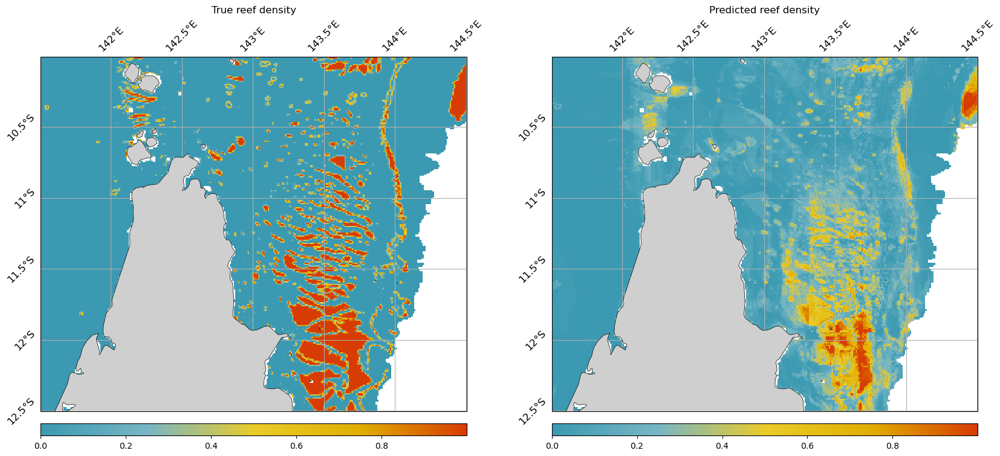

In [74]:
fig, ax = plt.subplots(ncols=2, subplot_kw={"projection": ccrs.PlateCarree()}, figsize=[20,10])
tight_lons = [141.5, 144.5]
tight_lats = [-12.5, -10]

spatial_plots.plot_spatial(combined_preds_gt["UNEP_GDCR"].sel(latitude=slice(*tight_lats), longitude=slice(*tight_lons)), fax=(fig, ax[0]), cbar_dict={"orientation": "horizontal"}, presentation_format=False,
                           title="True reef density")
spatial_plots.plot_spatial(scaled_pred.sel(latitude=slice(*tight_lats), longitude=slice(*tight_lons)), fax=(fig, ax[1]), cbar_dict={"orientation": "horizontal"}, presentation_format=False,
                           title="Predicted reef density")

/maps/rt582/miniforge3/envs/shiftpy/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/maps/rt582/miniforge3/envs/shiftpy/lib/python3.12/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


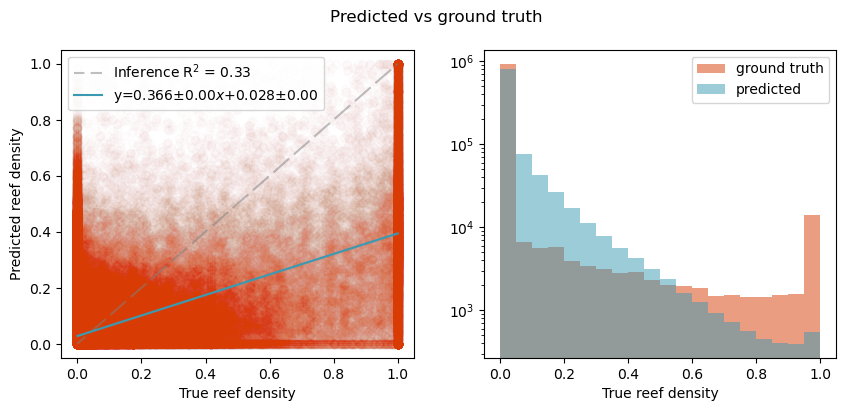

In [208]:
gt_df = gt["UNEP_GDCR"].to_dataframe()["UNEP_GDCR"]
# combine gt_df and pred_df, dropping indices not in pred_df
cc_combined_df = pd.concat([gt_df, cc_pred_df], axis=1).dropna()

# scale "predictions" between minimum and maximum of "UNEP_GDCR"
# min_gt, max_gt = combined_df["UNEP_GDCR"].min(), combined_df["UNEP_GDCR"].max()
# min_pred, max_pred = combined_df["prediction"].min(), combined_df["prediction"].max()
# scaled_pred_vals = (combined_df["prediction"] - min_pred) / (max_pred - min_pred) * (max_gt - min_gt) + min_gt
# plot scatter
# visualise_results.plot_regression_histograms(combined_df["UNEP_GDCR"], scaled_pred_vals, alpha_scatter=0.01)
visualise_results.plot_regression_histograms(cc_combined_df["UNEP_GDCR"], cc_combined_df["prediction"], alpha_scatter=0.01)

## Pixelwise

In [209]:
config_info = file_ops.read_yaml(config.config_dir / "config_test.yaml")
config_class = Config(config_info)
config_class.split_type = "pixelwise"
config_class.resolution = 0.01
# predictions = pd.Series()
predictions = []
model_code = "xgb_reg"
n_jobs = 160
# get merged datasets
ds = ml_processing.ProcessMLData(config_info=config_class).get_merged_datasets()

num_rounds = 1000
# params = {"objective": "reg:squarederror", "tree_method": "hist"}
params = {'objective': 'reg:squarederror', 'max_depth': 31, 'eval_metric': 'rmse', 'colsample_bytree': 0.29999999999999993}

# perform parameter search for best params


random_state = 0
total_num_samples = 1
pixelwise_combined_preds = []
# predictions = [pd.read_parquet(Path(config.data_dir / "ml_ready/pixelwise_combined_preds_rs_63.parquet"))]
# split datasets with incrementing random seed
while len(pixelwise_combined_preds) < total_num_samples:  # TODO: add ea,rly stopping if too many rounds exceeded
    # TODO: could this splitting be done more intelligently? I.e. still random, but keep adjusting seed in a clever way to maximise coverage
    # split data
    config_class.random_state = random_state
    (trains, tests, vals), ds_info = ml_processing.ProcessMLData(config_info=config_class).generate_ml_ready_data(ds = ds)
    dtrain = xgb.DMatrix(trains[0], trains[1])
    dtest = xgb.DMatrix(tests[0], tests[1])
    evals = [(dtrain, "train"), (dtest, "validation")]
    total_num_samples = len(trains[1]) + len(tests[1])

    model = xgb.train(
        params=params,
        dtrain=dtrain,
        # num_boost_round=num_rounds,
        evals=evals,
        verbose_eval=100,
        early_stopping_rounds=50
        )
    preds = pd.Series(model.predict(dtest), tests[1].index)
    # TODO: concatentate/merge on the fly to prevent creating a massive list of dataframes
    # append inferred (series) to list
    # predictions.append(preds) # concatenating on rolling basis to save memory
    # pixelwise_combined_preds = pd.concat([preds, predictions], axis=1).mean(axis=1)
    predictions.append(preds)
    pixelwise_combined_preds = pd.concat(predictions, axis=1).mean(axis=1)
    
    print(f"Ratio complete: {len(pixelwise_combined_preds)}/{total_num_samples} ({len(pixelwise_combined_preds)/total_num_samples})")
    random_state += 1

Searching for correct CMIP files in: /maps-priv/maps/rt582/coralshift/data/env_vars/cmip6/EC-Earth3P-HR/r1i1p2f1/regridded
	calculating statistics for static ML model(s)...


calculating statistics for variables: 100%|██████████| 9/9 [00:01<00:00,  4.85it/s]


	applying spatial buffering...
360 raster(s) to spatially buffer...


Buffering variables: 100%|██████████| 360/360 [00:26<00:00, 13.71it/s]


	resampling dataset to 0.01 degree(s) resolution...

Resampling pipeline: written raster CRS to EPSG:4326
Loading UNEP_GDCR xarray at 0.004 degrees resolution.
loading from /maps-priv/maps/rt582/coralshift/data/ground_truth/UNEP_GDCR/rasters/unep_0-004_S90-1_N90-1_W180-1_E180-1.nc
	applying spatial buffering...
1 raster(s) to spatially buffer...


Buffering variables: 100%|██████████| 1/1 [00:00<00:00, 11.24it/s]


	resampling dataset to 0.01 degree(s) resolution...

Resampling pipeline: written raster CRS to EPSG:4326
Loading gebco elevation xarray across [-31, -1] latitudes & [139, 167] longitudes from /maps-priv/maps/rt582/coralshift/data/bathymetry/gebco/GEBCO_2023_n90-0_s90-0_w180-0_e180-0.nc.
	applying spatial buffering...
1 raster(s) to spatially buffer...


Buffering variables: 100%|██████████| 1/1 [00:00<00:00, 10.64it/s]

Transposing filled array to match the original shape.


	resampling dataset to 0.01 degree(s) resolution...

Resampling pipeline: written raster CRS to EPSG:4326
Loading gebco elevation xarray across [-31, -1] latitudes & [139, 167] longitudes from /maps-priv/maps/rt582/coralshift/data/bathymetry/gebco/GEBCO_2023_n90-0_s90-0_w180-0_e180-0.nc.
calculating slopes from bathymetry...
	applying spatial buffering...
1 raster(s) to spatially buffer...


Buffering variables: 100%|██████████| 1/1 [00:08<00:00,  8.55s/it]

Transposing filled array to match the original shape.


	resampling dataset to 0.01 degree(s) resolution...

Resampling pipeline: written raster CRS to EPSG:4326
	fitting scaler to X data...
	fitting scaler to y data...

	transforming data...
[0]	train-rmse:0.11460	validation-rmse:0.12251
[9]	train-rmse:0.01172	validation-rmse:0.06924
Ratio complete: 199588/997937 (0.20000060124035887)
	fitting scaler to X data...
	fitting scaler to y data...

	transforming data...
[0]	train-rmse:0.11433	validation-rmse:0.12475
[9]	train-rmse:0.01200	validation-rmse:0.06964
Ratio complete: 359171/997937 (0.3599135015537053)
	fitting scaler to X data...
	fitting scaler to y data...

	transforming data...
[0]	train-rmse:0.11423	validation-rmse:0.12419
[9]	train-rmse:0.01167	validation-rmse:0.06944
Ratio complete: 486833/997937 (0.48783941270841746)
	fitting scaler to X data...
	fitting scaler to y data...

	transforming data...
[0]	train-rmse:0.11437	validation-rmse:0.12444
[9]	train-rmse:0.01171	validation-rmse:0.07039
Ratio complete: 589087/997937 (0.590304

In [211]:
# save to parquet
pixelwise_pred_df = pixelwise_combined_preds.to_frame(name="prediction")
pixelwise_pred_df.to_parquet(Path(config.data_dir / f"ml_ready/pixelwise_combined_0_01_preds_rs_{random_state}.parquet"))

In [213]:
# threshold predictions to 0 and 1
pixelwise_pred_df["prediction"] = pixelwise_pred_df["prediction"].clip(0, 1)
pixelwise_pred_ds = spatial_data.spatially_reform_data(pixelwise_pred_df, resolution=0.1)

gt = get_data.ReturnRaster(config_info=config_class).return_raster(dataset="unep")

interped_pred = pixelwise_pred_ds.interp_like(gt)
pixelwise_combined_preds_gt = xa.merge([interped_pred, gt])

# in pixelwise_combined_preds_gt, make gt values nan where interped_pred is nan
pixelwise_combined_preds_gt["UNEP_GDCR"] = pixelwise_combined_preds_gt["UNEP_GDCR"].where(~np.isnan(pixelwise_combined_preds_gt["prediction"]))

Loading UNEP_GDCR xarray at 0.004 degrees resolution.
loading from /maps-priv/maps/rt582/coralshift/data/ground_truth/UNEP_GDCR/rasters/unep_0-004_S90-1_N90-1_W180-1_E180-1.nc
	applying spatial buffering...
1 raster(s) to spatially buffer...


Buffering variables: 100%|██████████| 1/1 [00:00<00:00, 11.52it/s]


	resampling dataset to 0.01 degree(s) resolution...

Resampling pipeline: written raster CRS to EPSG:4326


(array([883375.,  20639.,  11776.,   7632.,   5423.,   4158.,   3502.,
          3467.,   3549.,   5870.]),
 array([3.42121982e-22, 9.98411417e-02, 1.99682283e-01, 2.99523425e-01,
        3.99364567e-01, 4.99205708e-01, 5.99046850e-01, 6.98887992e-01,
        7.98729134e-01, 8.98570275e-01, 9.98411417e-01]),
 <BarContainer object of 10 artists>)

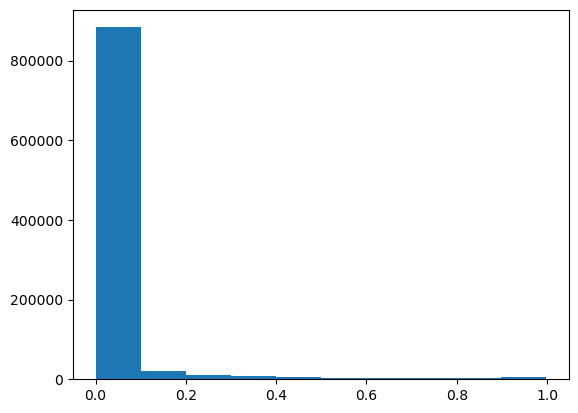

In [214]:
plt.hist(pixelwise_combined_preds_gt["prediction"].values.flatten())

(<Figure size 2000x1000 with 4 Axes>,
 <GeoAxes: title={'center': 'Predicted reef density'}, xlabel='longitude [degrees_east]', ylabel='latitude [degrees_north]'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x73447e927920>)

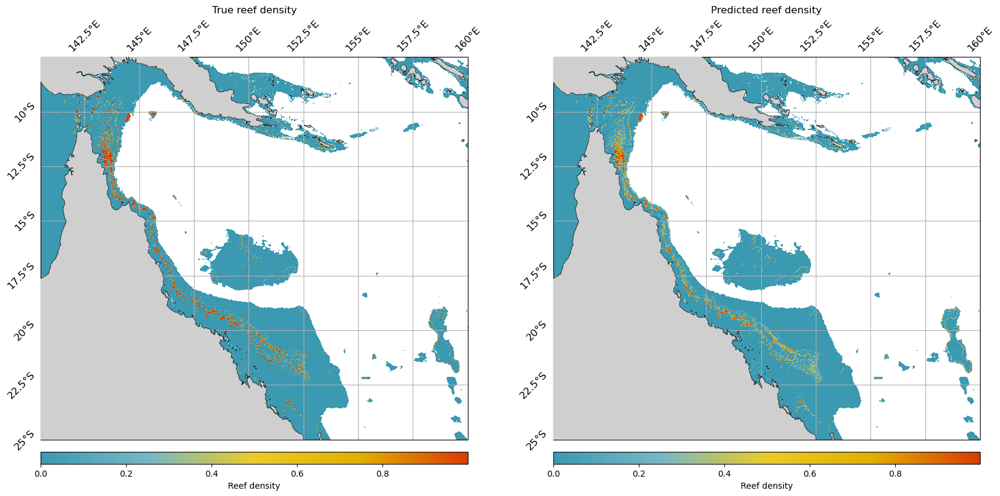

In [216]:
lats = [-25,-7.5]
lons = [140.5,160]

# plot comparison
fig, ax = plt.subplots(ncols=2, subplot_kw={"projection": ccrs.PlateCarree()}, figsize=[20,10])
# scale "prediction" between minimum and maximum of "UNEP_GDCR". THIS SEEMS INEXCUSABLE, LEAVING COMMENTED FOR DISCUSSION
# min_gt, max_gt = pixelwise_combined_preds_gt["UNEP_GDCR"].min(), pixelwise_combined_preds_gt["UNEP_GDCR"].max()
# min_pred, max_pred = pixelwise_combined_preds_gt["prediction"].min(), pixelwise_combined_preds_gt["prediction"].max()
# pixelwise_scaled_pred = (pixelwise_combined_preds_gt["prediction"] - min_pred) / (max_pred - min_pred) * (max_gt - min_gt) + min_gt

spatial_plots.plot_spatial(pixelwise_combined_preds_gt["UNEP_GDCR"].sel(latitude=slice(*lats), longitude=slice(*lons)), fax=(fig, ax[0]), cbar_dict={"orientation": "horizontal", "cbar_name": "Reef density"}, presentation_format=False,
                           title="True reef density")
spatial_plots.plot_spatial(pixelwise_combined_preds_gt["prediction"].sel(latitude=slice(*lats), longitude=slice(*lons)), fax=(fig, ax[1]), cbar_dict={"orientation": "horizontal", "cbar_name": "Reef density"}, presentation_format=False,
                           title="Predicted reef density")

(<Figure size 2000x1000 with 4 Axes>,
 <GeoAxes: title={'center': 'Predicted reef density'}, xlabel='longitude [degrees_east]', ylabel='latitude [degrees_north]'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x73447e9f4470>)

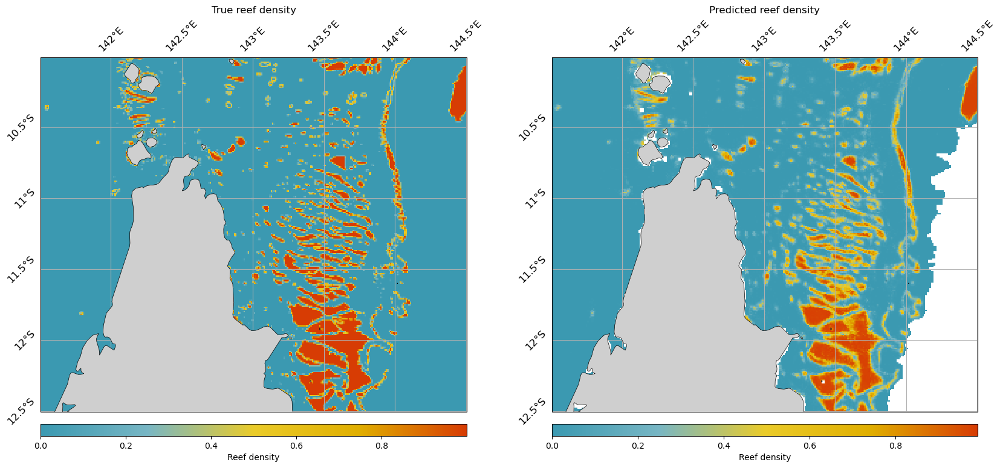

In [218]:
fig, ax = plt.subplots(ncols=2, subplot_kw={"projection": ccrs.PlateCarree()}, figsize=[20,10])
tight_lons = [141.5, 144.5]
tight_lats = [-12.5, -10]

spatial_plots.plot_spatial(gt["UNEP_GDCR"].sel(latitude=slice(*tight_lats), longitude=slice(*tight_lons)), fax=(fig, ax[0]), cbar_dict={"orientation": "horizontal", "cbar_name": "Reef density"}, presentation_format=False,
                           title="True reef density")
spatial_plots.plot_spatial(pixelwise_combined_preds_gt["prediction"].sel(latitude=slice(*tight_lats), longitude=slice(*tight_lons)), fax=(fig, ax[1]), cbar_dict={"orientation": "horizontal", "cbar_name": "Reef density"}, presentation_format=False,
                           title="Predicted reef density")
# spatial_plots.plot_spatial(pixelwise_combined_preds_gt["prediction"].sel(latitude=slice(*tight_lats), longitude=slice(*tight_lons)), fax=(fig, ax[1]), cbar_dict={"orientation": "horizontal", "cbar_name": "Reef density"}, presentation_format=False,
#                            title="Predicted reef density", val_lims = (gt.min().item(), gt.max().item()))

(<Figure size 2400x2400 with 2 Axes>,
 <GeoAxes: xlabel='longitude [degrees_east]', ylabel='latitude [degrees_north]'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x734487147590>)

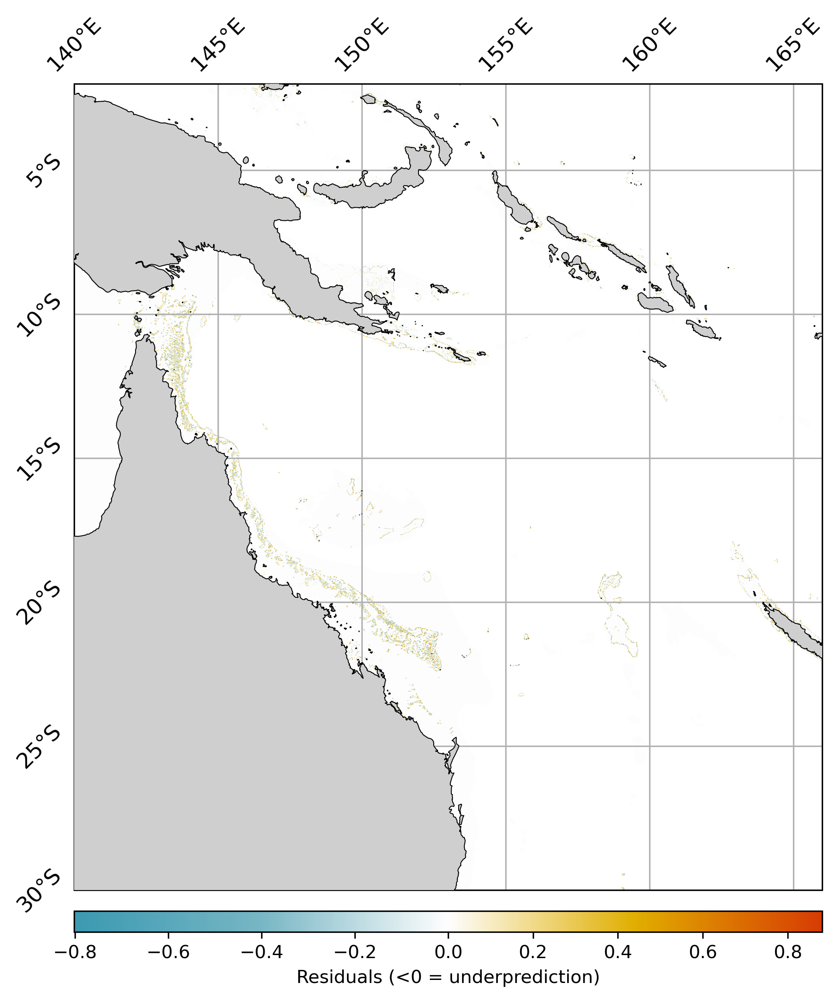

In [242]:
# plot spatial residuals
residuals = pixelwise_combined_preds_gt["UNEP_GDCR"] - pixelwise_combined_preds_gt["prediction"]
spatial_plots.plot_spatial(residuals, cbar_dict={"orientation": "horizontal", "cbar_name": "Residuals (<0 = underprediction)", "cmap_type": "div"}, presentation_format=False, title="", figsize=[8,8])

(<Figure size 2400x2400 with 2 Axes>,
 <GeoAxes: xlabel='longitude [degrees_east]', ylabel='latitude [degrees_north]'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x73447e4f2300>)

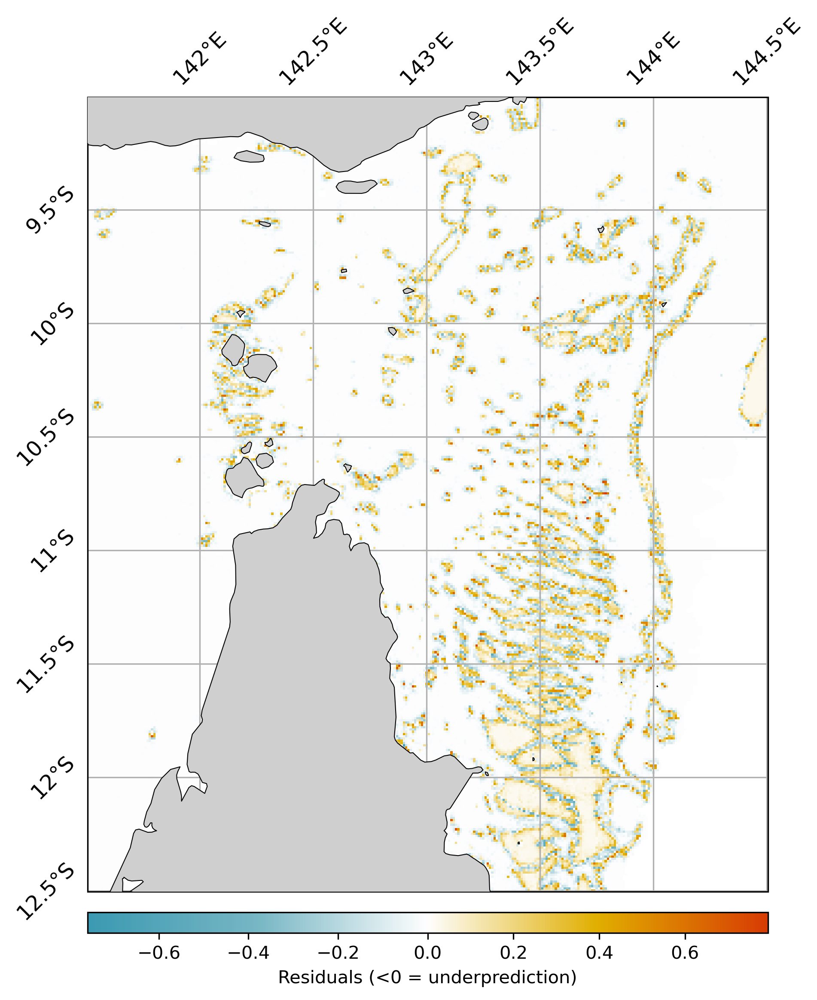

In [243]:
# plot spatial residuals
spatial_plots.plot_spatial(residuals.sel(latitude=slice(-12.5,-9), longitude=slice(*tight_lons)), cbar_dict={"orientation": "horizontal", "cbar_name": "Residuals (<0 = underprediction)", "cmap_type": "div"}, presentation_format=False, title="", figsize=(8,8))

/maps/rt582/miniforge3/envs/shiftpy/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/maps/rt582/miniforge3/envs/shiftpy/lib/python3.12/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


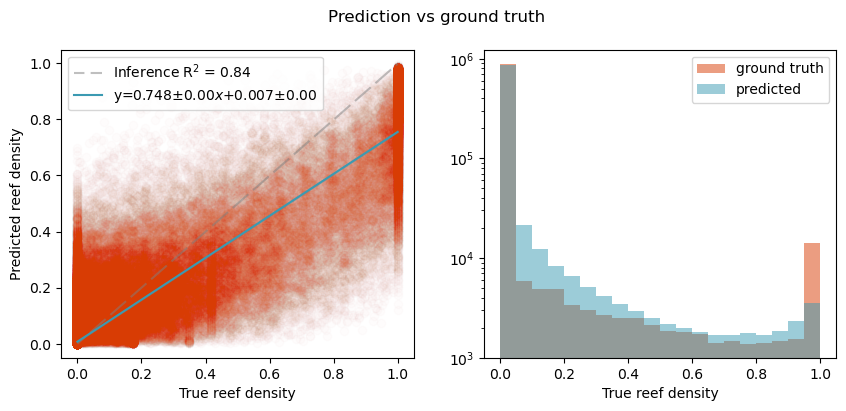

In [245]:
combined_no_nans = pixelwise_combined_preds_gt.to_dataframe().drop(columns=["spatial_ref"]).dropna()
visualise_results.plot_regression_histograms(combined_no_nans["UNEP_GDCR"], combined_no_nans["prediction"], alpha_scatter=0.01)


# Spatial splitting

In [2]:
config_info["datasets"] = ["cmip6", "unep"]
config_info

{'data_source': 'asdf',
 'regressor_classification_threshold': 0.01,
 'depth_mask': [-1000, 10],
 'ds_type': 'static',
 'predictand': 'UNEP_GDCR',
 'datasets': ['cmip6', 'unep'],
 'env_vars': ['tos',
  'mlotst',
  'rsdo',
  'so',
  'thetao',
  'uo',
  'vo',
  'hfds',
  'wfo'],
 'random_state': 42,
 'resolution': 0.01,
 'resolution_unit': 'd',
 'year_range_to_include': [1950, 2015],
 'upsample_method': 'linear',
 'downsample_method': 'mean',
 'spatial_buffer': 10,
 'save_figs': True,
 'do_train': True,
 'do_save_model': True,
 'do_plot': True,
 'processing': {'do_crop': False},
 'lats': [-30, -2],
 'lons': [140, 166],
 'levs': [0, 20],
 'split_type': 'spatial',
 'test_geom': [-16, -10, 140, 160],
 'train_test_val_frac': [0.8, 0.2, 0],
 'X_scaler': 'standard',
 'y_scaler': 'minmax',
 'hyperparameter_search': {'cv_folds': 5,
  'n_samples': -1,
  'n_iter': 100,
  'type': 'random',
  'do_search': False,
  'n_trials': 5,
  'search_types': ['random'],
  'n_jobs': 8},
 'source_id': 'EC-Earth3P

In [3]:
# minimise complexity of example data
config_info["env_vars"] = ["tos"]
config_info["datasets"] = ["cmip6", "unep"]
config_info["resolution"] = 0.1
# get example merged
ds = ml_processing.ProcessMLData(config_info).get_merged_datasets()[["tos_overall_mean", "UNEP_GDCR", "elevation"]]

Searching for correct CMIP files in: /maps-priv/maps/rt582/coralshift/data/env_vars/cmip6/EC-Earth3P-HR/r1i1p2f1/regridded
	calculating statistics for static ML model(s)...


calculating statistics for variables: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]


	applying spatial buffering...
40 raster(s) to spatially buffer...


Buffering variables: 100%|██████████| 40/40 [00:02<00:00, 16.99it/s]


	resampling dataset to 0.1 degree(s) resolution...

Resampling pipeline: written raster CRS to EPSG:4326
Loading UNEP_GDCR xarray at 0.004 degrees resolution.
	applying spatial buffering...
1 raster(s) to spatially buffer...


Buffering variables: 100%|██████████| 1/1 [00:00<00:00, 10.28it/s]


	resampling dataset to 0.1 degree(s) resolution...

Resampling pipeline: written raster CRS to EPSG:4326


KeyboardInterrupt: 

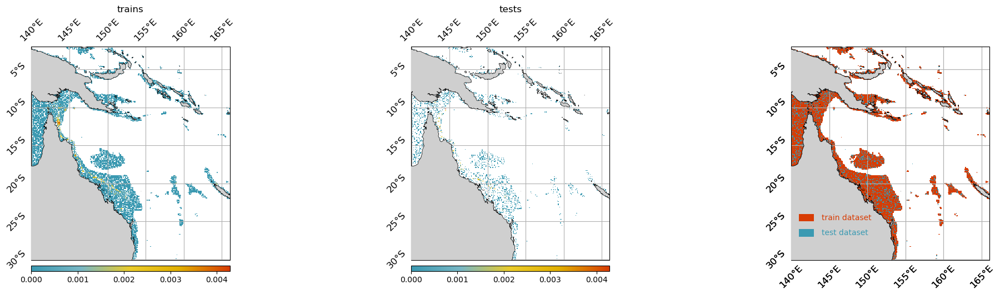

In [ ]:
# pixelwise
config_info["split_type"] = "pixelwise"
trains, tests, _ = ml_processing.ProcessMLData(config_info).split_dataset(ds)
# reform spatially
pixel_trains = spatial_data.spatially_reform_data(trains[1], resolution=config_info["resolution"])
pixel_tests = spatial_data.spatially_reform_data(tests[1], resolution=config_info["resolution"])
# plot
f, axes = plt.subplots(1, 3, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(25, 5))
spatial_plots.plot_spatial(pixel_trains["UNEP_GDCR"], title="trains", fax=(f, axes[0]), cbar_dict={"orientation": "horizontal"})
spatial_plots.plot_spatial(pixel_tests["UNEP_GDCR"], title="tests", fax=(f, axes[1]), cbar_dict={"orientation": "horizontal"})
spatial_plots.plot_train_test_datasets(pixel_trains["UNEP_GDCR"], pixel_tests["UNEP_GDCR"], fax=(f, axes[2]))

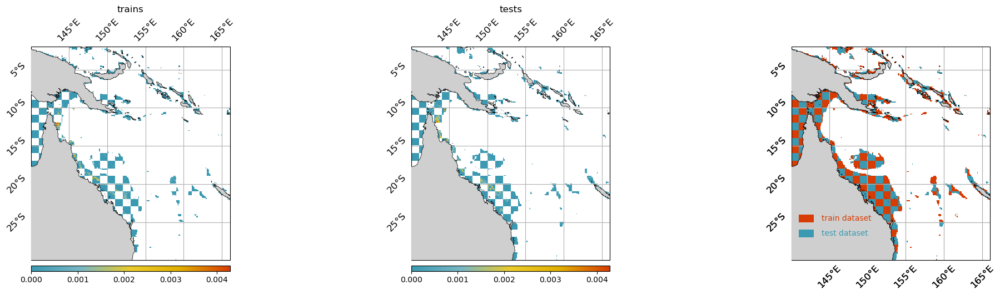

In [ ]:
# checkerboard
config_info["split_type"] = "checkerboard"
trains, tests, _ = ml_processing.ProcessMLData(config_info).split_dataset(ds)
# reform spatially
checkerboard_trains = spatial_data.spatially_reform_data(trains[1], resolution=config_info["resolution"])
checkerboard_tests = spatial_data.spatially_reform_data(tests[1], resolution=config_info["resolution"])
# plot
f, axes = plt.subplots(1, 3, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(25, 5))
spatial_plots.plot_spatial(checkerboard_trains["UNEP_GDCR"], title="trains", fax=(f, axes[0]), cbar_dict={"orientation": "horizontal"})
spatial_plots.plot_spatial(checkerboard_tests["UNEP_GDCR"], title="tests", fax=(f, axes[1]), cbar_dict={"orientation": "horizontal"})
spatial_plots.plot_train_test_datasets(checkerboard_trains["UNEP_GDCR"], checkerboard_tests["UNEP_GDCR"], fax=(f, axes[2]))

100%|██████████| 364/364 [00:00<00:00, 3102.37it/s]


Final ratio test fraction: 0.1658857541620975


100%|██████████| 364/364 [00:00<00:00, 3483.38it/s]


Final ratio test fraction: 0.1658857541620975


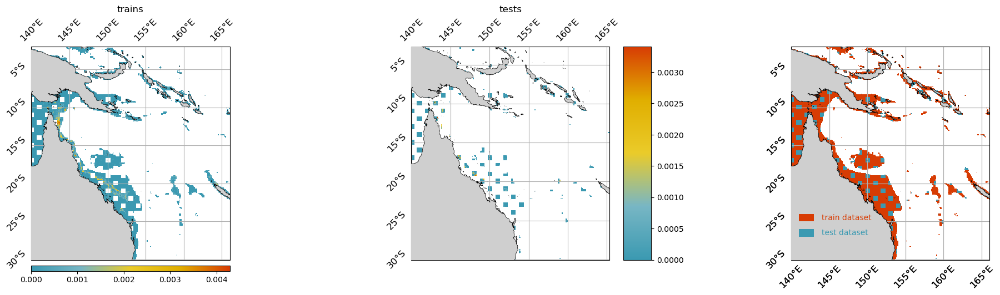

In [ ]:
# custom checkerboard
config_info["split_type"] = "custom_checkerboard"
trains, tests, _ = ml_processing.ProcessMLData(config_info).split_dataset(ds)
# reform spatially
ccheckerboard_trains = spatial_data.spatially_reform_data(trains[1], resolution=config_info["resolution"])
ccheckerboard_tests = spatial_data.spatially_reform_data(tests[1], resolution=config_info["resolution"])
# plot
f, axes = plt.subplots(1, 3, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(25, 5))
spatial_plots.plot_spatial(ccheckerboard_trains["UNEP_GDCR"], title="trains", fax=(f, axes[0]), cbar_dict={"orientation": "horizontal"})
spatial_plots.plot_spatial(ccheckerboard_tests["UNEP_GDCR"], title="tests", fax=(f, axes[1]), cbar_dict={"orientation": "vertical"})
spatial_plots.plot_train_test_datasets(ccheckerboard_trains["UNEP_GDCR"], ccheckerboard_tests["UNEP_GDCR"], fax=(f, axes[2]))

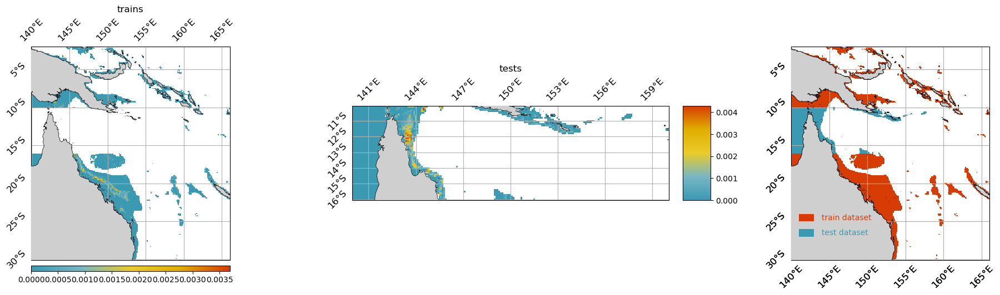

In [ ]:
config_info["split_type"] = "spatial"
trains, tests, _ = ml_processing.ProcessMLData(config_info).split_dataset(ds)
# reform spatially
trains_spatial = spatial_data.spatially_reform_data(trains[1], resolution=config_info["resolution"])
tests_spatial = spatial_data.spatially_reform_data(tests[1], resolution=config_info["resolution"])
# plot
f, axes = plt.subplots(1, 3, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(25, 5))
spatial_plots.plot_spatial(trains_spatial["UNEP_GDCR"], title="trains", fax=(f, axes[0]), cbar_dict={"orientation": "horizontal"})
spatial_plots.plot_spatial(tests_spatial["UNEP_GDCR"], title="tests", fax=(f, axes[1]), cbar_dict={"orientation": "vertical"})
spatial_plots.plot_train_test_datasets(trains_spatial["UNEP_GDCR"], tests_spatial["UNEP_GDCR"], fax=(f, axes[2]))

## Marking train/test

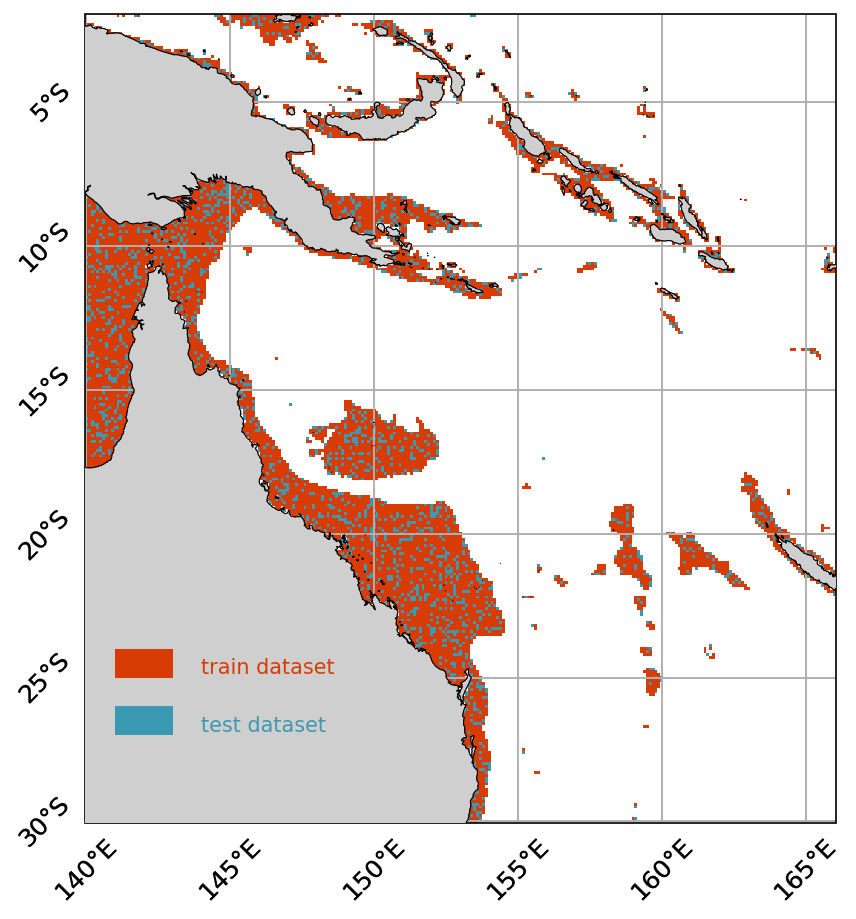

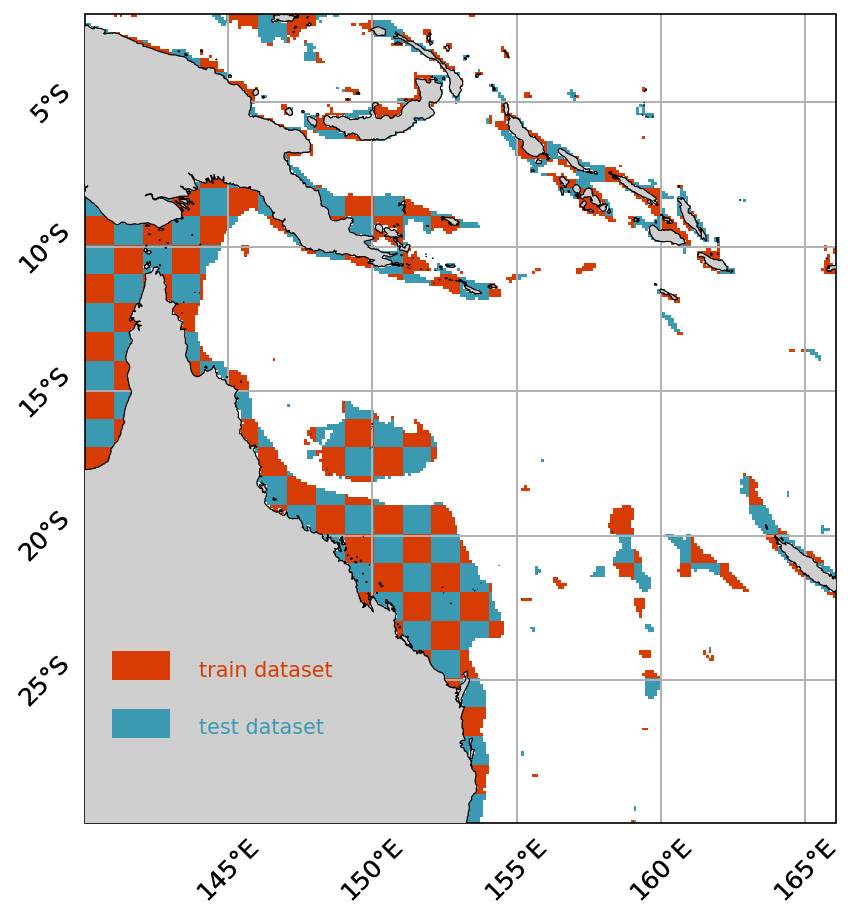

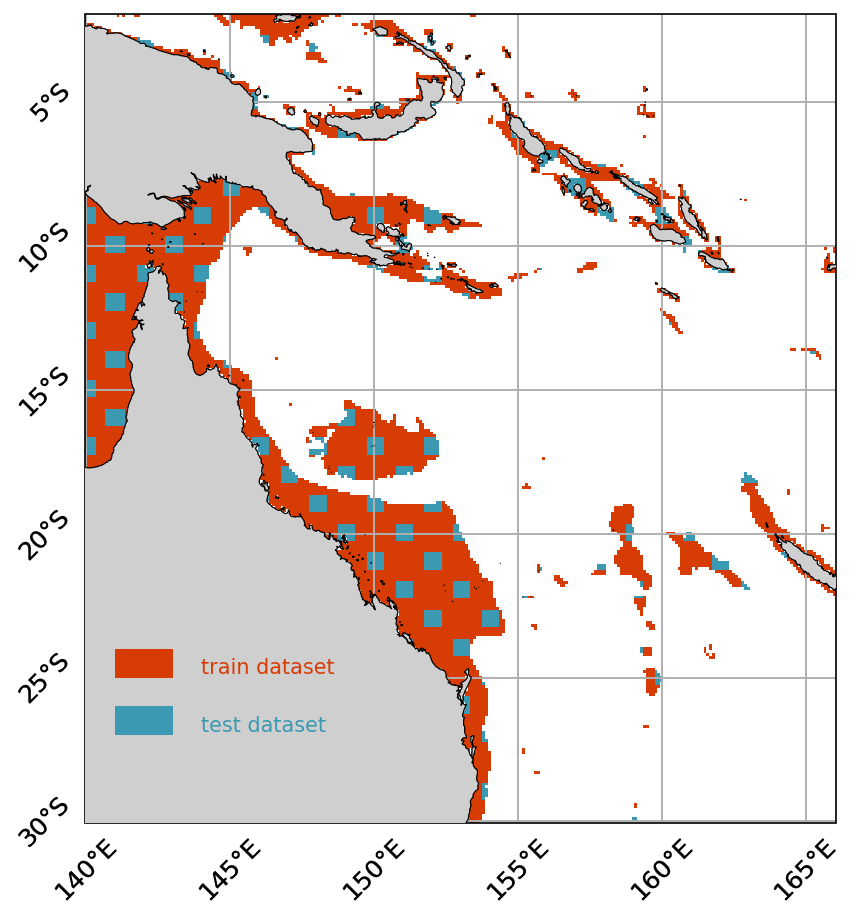

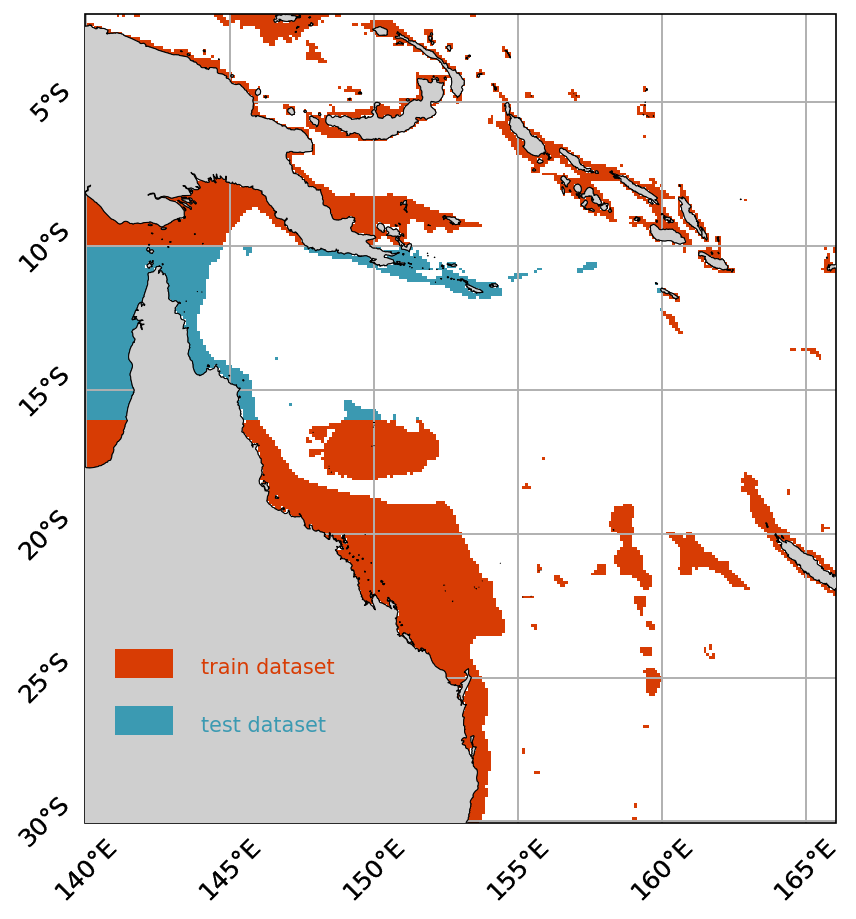

In [ ]:
for split_type, train, test in [("pixelwise", pixel_trains, pixel_tests), ("checkerboard", checkerboard_trains, checkerboard_tests), ("custom_checkerboard", ccheckerboard_trains, ccheckerboard_tests), ("spatial", trains_spatial, tests_spatial)]:
    spatial_plots.plot_train_test_datasets(train["UNEP_GDCR"], test["UNEP_GDCR"], figsize=(7,7))
    # save figures
    fig_dir = Path("/maps/rt582/coralshift/runs/figures")
    plt.savefig(f"{fig_dir}/train_test_datasets_{split_type}.png")

# Training/inferring

In [4]:
# ALREADY DONE
# # get merged dataset
# ds = ml_processing.ProcessMLData(config_info=config_info).get_merged_datasets()
# # save 0.01 degree resolution data as one large netcdf file
# ds.to_netcdf("/maps/rt582/coralshift/data/ml_ready/all_vars_0-01.nc")
# open dataset
ds = xa.open_dataset("/maps/rt582/coralshift/data/ml_ready/all_vars_0-01.nc")

### Spatial

In [5]:
# # ALREADY DONE FOR -16_-10_140_160
# # generate train, test data
# (trains, tests, vals), ds_info = ml_processing.ProcessMLData(config_info=config_info).generate_ml_ready_data(ds = ds)

# # save processed dfs to parquet files
# X_trains = trains[0]
# y_trains = pd.DataFrame(trains[1])
# X_tests = tests[0]
# y_tests = pd.DataFrame(tests[1])

# # save to parquet
# X_trains.to_parquet(f"/maps/rt582/coralshift/data/ml_ready/spatial_-16_-10_140_160/X_trains.parquet")
# y_trains.to_parquet(f"/maps/rt582/coralshift/data/ml_ready/spatial_-16_-10_140_160/y_trains.parquet")
# X_tests.to_parquet(f"/maps/rt582/coralshift/data/ml_ready/spatial_-16_-10_140_160/X_tests.parquet")
# y_tests.to_parquet(f"/maps/rt582/coralshift/data/ml_ready/spatial_-16_-10_140_160/y_tests.parquet")

In [6]:
# open parquet files
X_trains = pd.read_parquet(f"/maps/rt582/coralshift/data/ml_ready/spatial_-16_-10_140_160/X_trains.parquet")
y_trains = pd.read_parquet(f"/maps/rt582/coralshift/data/ml_ready/spatial_-16_-10_140_160/y_trains.parquet")
X_tests = pd.read_parquet(f"/maps/rt582/coralshift/data/ml_ready/spatial_-16_-10_140_160/X_tests.parquet")
y_tests = pd.read_parquet(f"/maps/rt582/coralshift/data/ml_ready/spatial_-16_-10_140_160/y_tests.parquet")

(<Figure size 3000x3000 with 2 Axes>,
 <GeoAxes: title={'center': 'tests'}, xlabel='longitude', ylabel='latitude'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7f3f8b0fb9e0>)

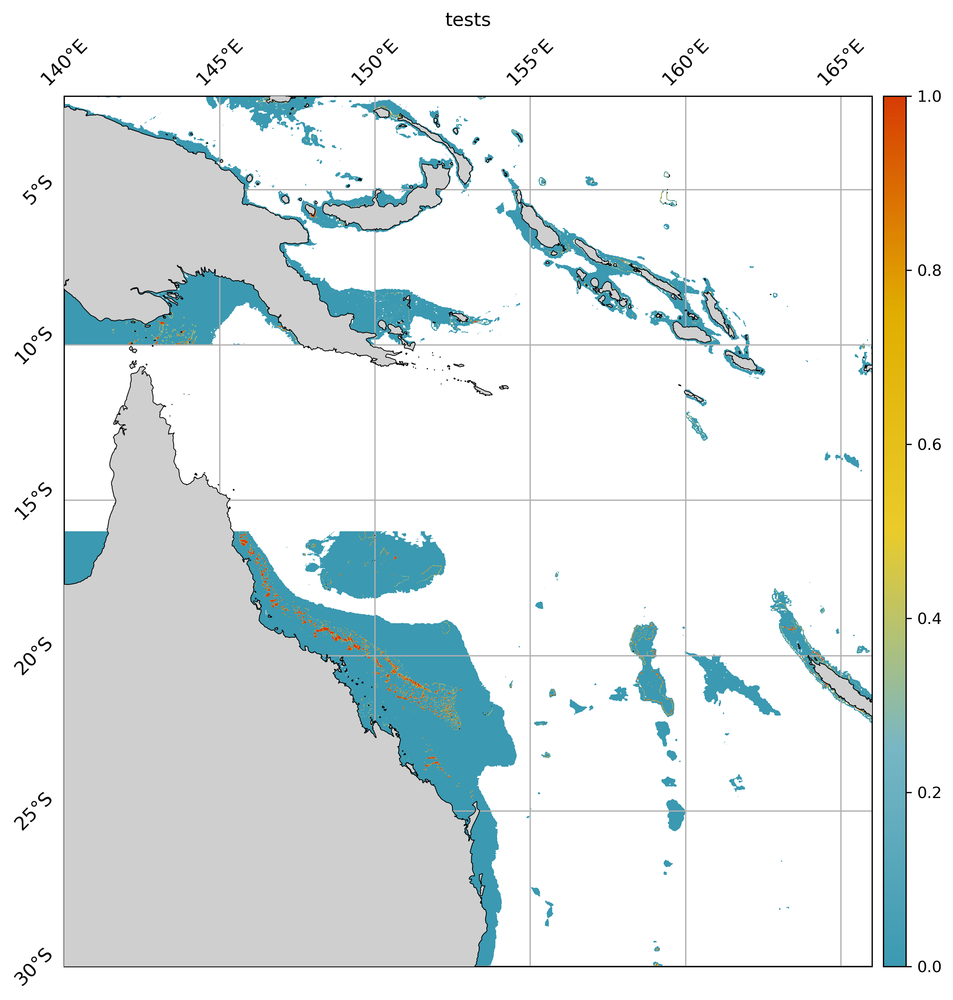

In [7]:
# reform spatially to check
trains_spatial = spatial_data.spatially_reform_data(y_trains, resolution=config_info["resolution"])
spatial_plots.plot_spatial(trains_spatial[0], title="tests", cbar_dict={"orientation": "vertical"})

In [8]:
dtrain = xgb.DMatrix(X_trains, y_trains)
dtest = xgb.DMatrix(X_tests, y_tests)
evals = [(dtrain, "train"), (dtest, "validation")]

# use best-performing parameters from parameter sweep. N.B. different split types may require different parameters
params = {'objective': 'reg:squarederror', 'n_estimators': 945, 'max_depth': 31, 'eval_metric': 'rmse', 'colsample_bytree': 0.29999999999999993}
num_rounds = 1000

# train model
model = xgb.train(
    params=params,
    dtrain=dtrain,
    num_boost_round=num_rounds,
    evals=evals,
    verbose_eval=100,
    early_stopping_rounds=50
    )

/maps/rt582/miniforge3/envs/shiftpy/lib/python3.12/site-packages/xgboost/core.py:160: UserWarning: [01:50:36] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost-split_1713397725960/work/src/learner.cc:742: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.10040	validation-rmse:0.20426
[49]	train-rmse:0.00030	validation-rmse:0.21118


In [9]:
# make predictions
preds = model.predict(dtest)
# reform spatially
preds_spatial = spatial_data.spatially_reform_data(preds, resolution=config_info["resolution"])
y_tests_spatial = spatial_data.spatially_reform_data(y_tests, resolution=config_info["resolution"])

fig, ax = plt.subplots(2, 1, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(20, 7), dpi=300)
spatial_plots.plot_spatial(preds_spatial[0], title="tests", cbar_dict={"orientation": "vertical"}, fax=(fig, ax[0]))
spatial_plots.plot_spatial(y_tests_spatial[0], title="tests", cbar_dict={"orientation": "vertical"}, fax=(fig, ax[1]))

AttributeError: 'numpy.ndarray' object has no attribute 'index'

### Custom checkerboard

In [3]:
# ALREADY DONE
# # get merged dataset
# ds = ml_processing.ProcessMLData(config_info=config_info).get_merged_datasets()
# # save 0.01 degree resolution data as one large netcdf file
# ds.to_netcdf("/maps/rt582/coralshift/data/ml_ready/all_vars_0-01.nc")
# open dataset
ds = xa.open_dataset("/maps/rt582/coralshift/data/ml_ready/all_vars_0-01.nc")
# generate train, test data
config_info = file_ops.read_yaml(config_fp)
config_info["split_type"] = "custom_checkerboard"
# (trains, tests, _), ds_info = ml_processing.ProcessMLData(config_info=config_info).generate_ml_ready_data(ds = ds)

# # save processed dfs to parquet files
# X_trains = trains[0]
# y_trains = pd.DataFrame(trains[1])
# X_tests = tests[0]
# y_tests = pd.DataFrame(tests[1])

# # save to parquet
# X_trains.to_parquet(f"/maps/rt582/coralshift/data/ml_ready/ccheckerboard/X_trains.parquet")
# y_trains.to_parquet(f"/maps/rt582/coralshift/data/ml_ready/ccheckerboard/y_trains.parquet")
# X_tests.to_parquet(f"/maps/rt582/coralshift/data/ml_ready/ccheckerboard/X_tests.parquet")
# y_tests.to_parquet(f"/maps/rt582/coralshift/data/ml_ready/ccheckerboard/y_tests.parquet")

X_trains = pd.read_parquet(f"/maps/rt582/coralshift/data/ml_ready/ccheckerboard/X_trains.parquet")
y_trains = pd.read_parquet(f"/maps/rt582/coralshift/data/ml_ready/ccheckerboard/y_trains.parquet")
X_tests = pd.read_parquet(f"/maps/rt582/coralshift/data/ml_ready/ccheckerboard/X_tests.parquet")
y_tests = pd.read_parquet(f"/maps/rt582/coralshift/data/ml_ready/ccheckerboard/y_tests.parquet")

(<Figure size 750x750 with 2 Axes>,
 <GeoAxes: title={'center': 'tests'}, xlabel='longitude', ylabel='latitude'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7fe83f0005f0>)

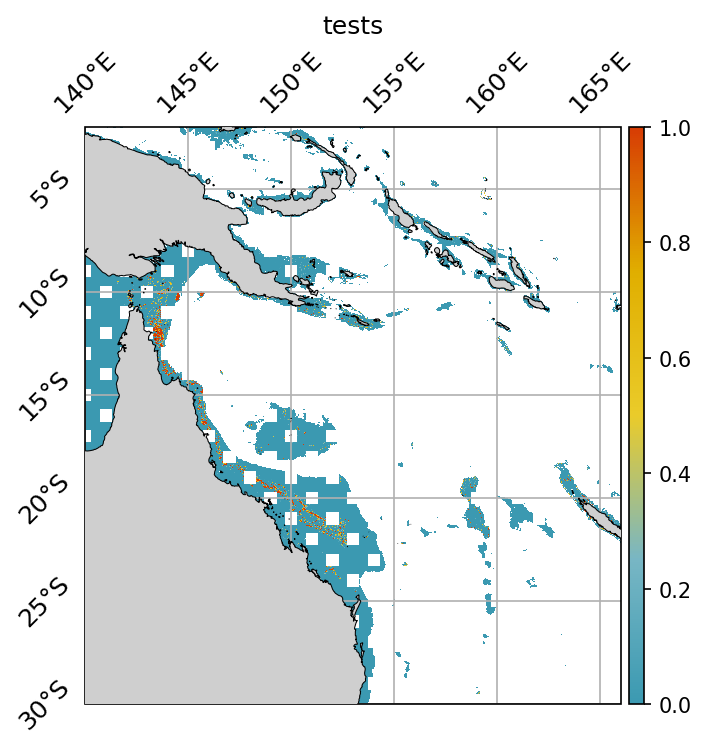

In [4]:
# reform spatially to check
trains_ccheckerboard = spatial_data.spatially_reform_data(y_trains, resolution=config_info["resolution"])
spatial_plots.plot_spatial(trains_ccheckerboard[0], title="tests", cbar_dict={"orientation": "vertical"}, dpi=150, figsize=(5, 5))

In [5]:
dtrain = xgb.DMatrix(X_trains, y_trains)
dtest = xgb.DMatrix(X_tests, y_tests)
evals = [(dtrain, "train"), (dtest, "validation")]

# use best-performing parameters from parameter sweep. N.B. different split types may require different parameters
params = {'objective': 'reg:squarederror', 'n_estimators': 945, 'max_depth': 31, 'eval_metric': 'rmse', 'colsample_bytree': 0.29999999999999993}
num_rounds = 1000

# train model
model = xgb.train(
    params=params,
    dtrain=dtrain,
    num_boost_round=num_rounds,
    evals=evals,
    verbose_eval=100,
    early_stopping_rounds=50
    )

/maps/rt582/miniforge3/envs/shiftpy/lib/python3.12/site-packages/xgboost/core.py:160: UserWarning: [13:21:48] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost-split_1713397725960/work/src/learner.cc:742: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.11611	validation-rmse:0.13348
[57]	train-rmse:0.00032	validation-rmse:0.11654


(<Figure size 6000x3000 with 4 Axes>,
 <GeoAxes: title={'center': 'tests'}, xlabel='longitude', ylabel='latitude'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7fe7e6d2ef60>)

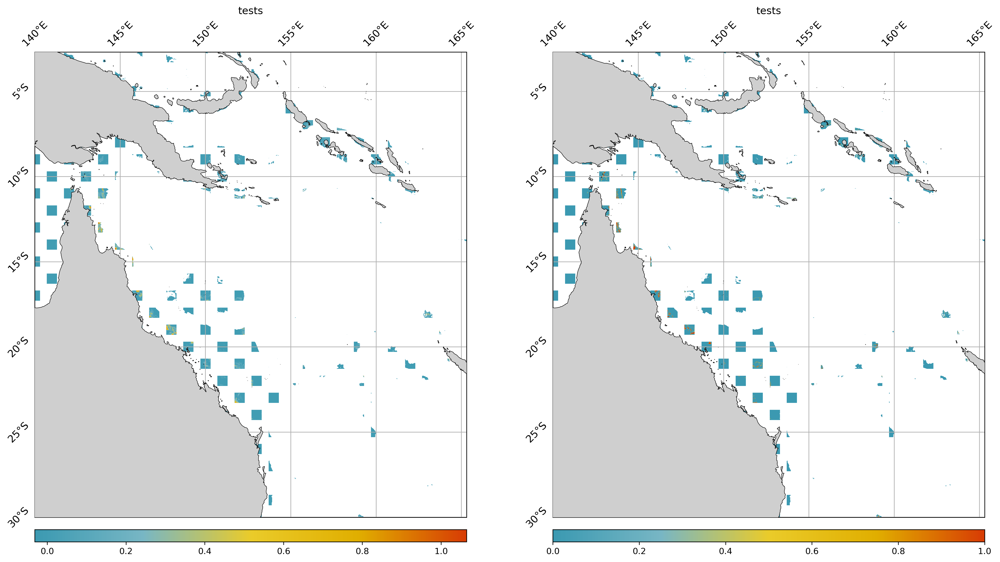

In [6]:
# make predictions
preds = pd.Series(model.predict(dtest), y_tests.index)
# reform spatially
preds_ccheckerboard = spatial_data.spatially_reform_data(preds, resolution=config_info["resolution"])
y_tests_ccheckerboard = spatial_data.spatially_reform_data(y_tests, resolution=config_info["resolution"])

fig, ax = plt.subplots(1, 2, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(20, 10), dpi=300)
spatial_plots.plot_spatial(preds_ccheckerboard[0], title="tests", cbar_dict={"orientation": "horizontal"}, fax=(fig, ax[0]))
spatial_plots.plot_spatial(y_tests_ccheckerboard[0], title="tests", cbar_dict={"orientation": "horizontal"}, fax=(fig, ax[1]))

(<Figure size 6000x3000 with 4 Axes>,
 <GeoAxes: title={'center': 'ground truth'}, xlabel='longitude', ylabel='latitude'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7fe7e74d1d00>)

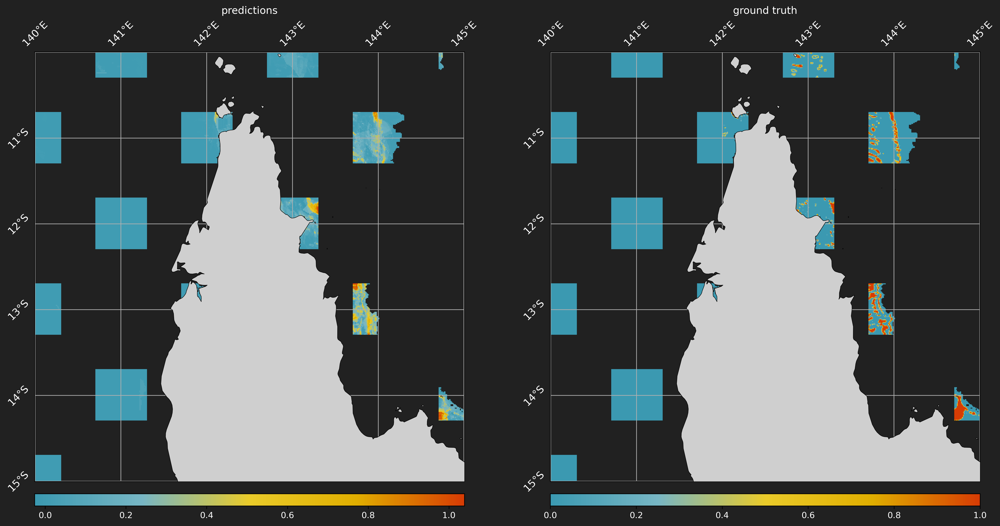

In [8]:
aoi_lats = [-15, -10]
aoi_lons = [140, 145]

# zoom into area
fig, ax = plt.subplots(1, 2, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(20, 10), dpi=300)
spatial_plots.plot_spatial(preds_ccheckerboard[0].sel(latitude=slice(min(aoi_lats), max(aoi_lats)), longitude=slice(min(aoi_lons), max(aoi_lons))),
    title="predictions", cbar_dict={"orientation": "horizontal"}, fax=(fig, ax[0]), presentation_format=True)
spatial_plots.plot_spatial(y_tests_ccheckerboard[0].sel(latitude=slice(min(aoi_lats), max(aoi_lats)), longitude=slice(min(aoi_lons), max(aoi_lons))),
    title="ground truth", cbar_dict={"orientation": "horizontal"}, fax=(fig, ax[1]), presentation_format=True)

(<Figure size 6000x3000 with 4 Axes>,
 <GeoAxes: xlabel='longitude', ylabel='latitude'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7fe7e7774050>)

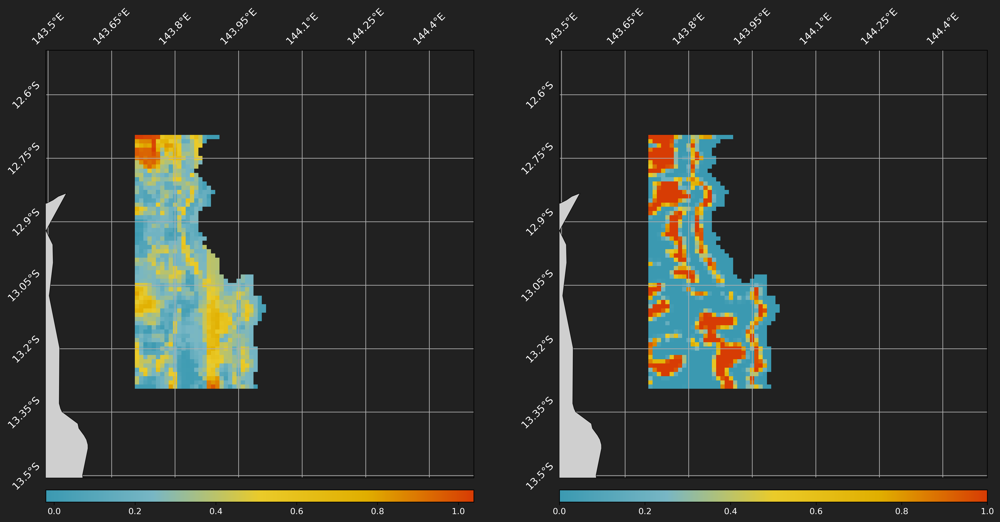

In [16]:
aoi_lats = [-13.5, -12.5]
aoi_lons = [143.5, 144.5]

# zoom into area
fig, ax = plt.subplots(1, 2, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(20, 10), dpi=300)
spatial_plots.plot_spatial(preds_ccheckerboard[0].sel(latitude=slice(min(aoi_lats), max(aoi_lats)), longitude=slice(min(aoi_lons), max(aoi_lons))),
    title=None, cbar_dict={"orientation": "horizontal"}, fax=(fig, ax[0]), presentation_format=True)
spatial_plots.plot_spatial(y_tests_ccheckerboard[0].sel(latitude=slice(min(aoi_lats), max(aoi_lats)), longitude=slice(min(aoi_lons), max(aoi_lons))),
    title=None, cbar_dict={"orientation": "horizontal"}, fax=(fig, ax[1]), presentation_format=True)

## Hyperparameter tuning

In [7]:
import joblib
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

rs_params = static_models.xgb_search_grid(n_trials=5)

# data = xgb.DMatrix(data=X, label=y)
xgb_reg = xgb.XGBRegressor(n_jobs=64, seed=42)
grid_mse = RandomizedSearchCV(
    estimator=xgb_reg, param_distributions=rs_params, scoring="r2", cv=3, verbose=10, n_jobs=1, n_iter=100)
grid_mse.fit(X_trains, y_trains)

print("Best parameters found: ", grid_mse.best_params_)
print("Lowest RMSE found: ", np.sqrt(np.abs(grid_mse.best_score_)))

# Save the trained model
joblib.dump(grid_mse, config.models_dir / 'trained_model.joblib')

Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV 1/3; 1/100] START colsample_bytree=0.5196152422706632, eval_metric=rmse, max_depth=1000, n_estimators=211, objective=reg:squarederror


KeyboardInterrupt: 

In [ ]:
grid_mse.best_params_

{'objective': 'reg:squarederror',
 'n_estimators': 100,
 'max_depth': 1,
 'eval_metric': 'rmse',
 'colsample_bytree': 0.1}

In [8]:
dtrain = xgb.DMatrix(X_trains, y_trains)
dtest = xgb.DMatrix(X_tests, y_tests)
evals = [(dtrain, "train"), (dtest, "validation")]

# use best-performing parameters from parameter sweep. New split params
params = {'objective': 'reg:squarederror', 'max_depth': 500, 'eval_metric': 'rmse', 'colsample_bytree': 0.5}
num_rounds = 1000

# train model
model = xgb.train(
    params=params,
    dtrain=dtrain,
    num_boost_round=num_rounds,
    evals=evals,
    verbose_eval=100,
    early_stopping_rounds=50
    )

/maps/rt582/miniforge3/envs/shiftpy/lib/python3.12/site-packages/xgboost/core.py:160: UserWarning: [14:19:22] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost-split_1713397725960/work/src/learner.cc:742: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.11543	validation-rmse:0.13229
[61]	train-rmse:0.00025	validation-rmse:0.10571


(<Figure size 6000x3000 with 4 Axes>,
 <GeoAxes: title={'center': 'tests'}, xlabel='longitude', ylabel='latitude'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7fe2fd7c1010>)

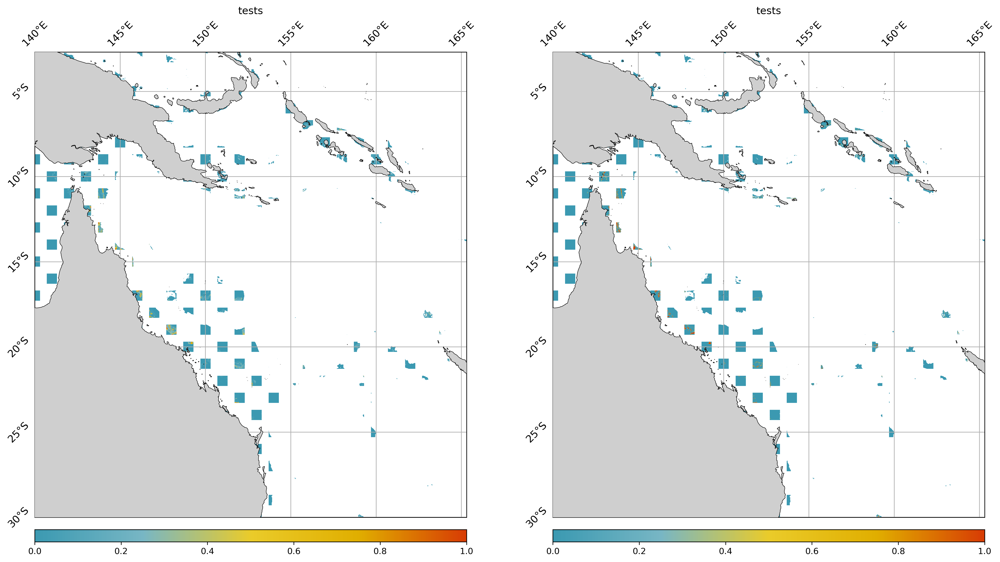

In [23]:
# make predictions
preds = pd.Series(model.predict(dtest), y_tests.index)
# constrain preds
preds.clip(0, 1, inplace=True)
# reform spatially
preds_ccheckerboard = spatial_data.spatially_reform_data(preds, resolution=config_info["resolution"])
y_tests_ccheckerboard = spatial_data.spatially_reform_data(y_tests, resolution=config_info["resolution"])

fig, ax = plt.subplots(1, 2, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(20, 10), dpi=300)
spatial_plots.plot_spatial(preds_ccheckerboard[0], title="tests", cbar_dict={"orientation": "horizontal"}, fax=(fig, ax[0]))
spatial_plots.plot_spatial(y_tests_ccheckerboard[0], title="tests", cbar_dict={"orientation": "horizontal"}, fax=(fig, ax[1]))

In [1]:
aoi_lats = [-15, -10]
aoi_lons = [140, 145]

# zoom into area
fig, ax = plt.subplots(1, 2, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(20, 10), dpi=300)
spatial_plots.plot_spatial(preds_ccheckerboard[0].sel(latitude=slice(min(aoi_lats), max(aoi_lats)), longitude=slice(min(aoi_lons), max(aoi_lons))),
    title="tests", cbar_dict={"orientation": "horizontal"}, fax=(fig, ax[0]))
spatial_plots.plot_spatial(y_tests_ccheckerboard[0].sel(latitude=slice(min(aoi_lats), max(aoi_lats)), longitude=slice(min(aoi_lons), max(aoi_lons))),
    title="tests", cbar_dict={"orientation": "horizontal"}, fax=(fig, ax[1]))

NameError: name 'plt' is not defined

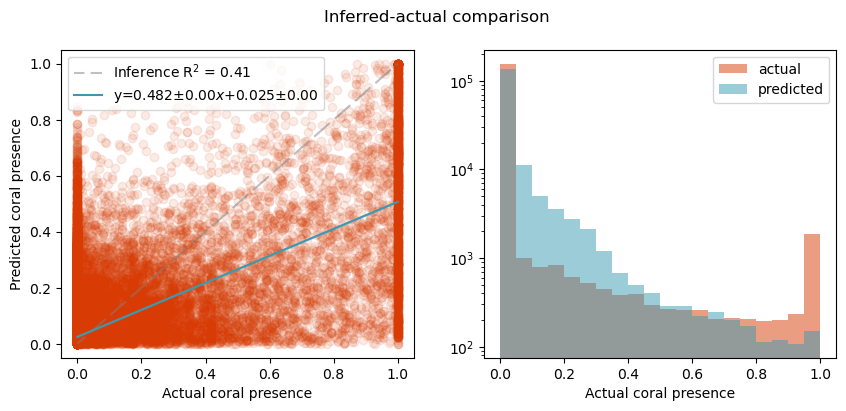

In [28]:
visualise_results.plot_regression_histograms(y_tests[0], preds)

In [30]:
y_tests_ccheckerboard[0]

<xarray.DataArray 0 (latitude: 2731, longitude: 2531)> Size: 55MB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * latitude   (latitude) float64 22kB -30.0 -29.99 -29.98 ... -2.72 -2.71 -2.7
  * longitude  (longitude) float64 20kB 140.0 140.0 140.0 ... 165.3 165.3 165.3

(<Figure size 1600x1400 with 2 Axes>,
 <GeoAxes: title={'center': 'residuals at 0.0100° (~1085 m) resolution'}, xlabel='longitude', ylabel='latitude'>)

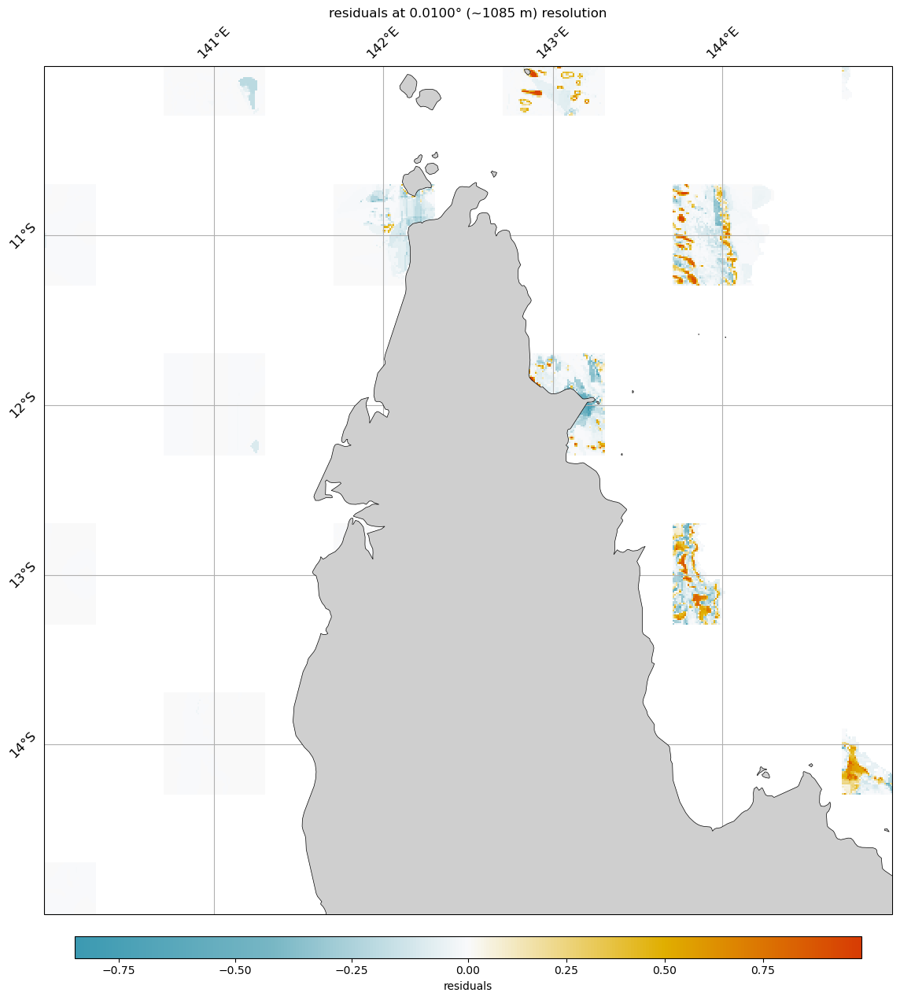

In [36]:
visualise_results.plot_spatial_residuals(y_tests[0], preds, extent=[min(aoi_lons), max(aoi_lons), min(aoi_lats), max(aoi_lats)])


In [40]:
# get models most important features
importances = model.get_score(importance_type="weight")
# plot feature importances from dictionary of names and values

In [56]:
importances

{'tos_january_mean': 32979.0,
 'tos_february_mean': 19189.0,
 'tos_march_mean': 17814.0,
 'tos_april_mean': 25943.0,
 'tos_may_mean': 27120.0,
 'tos_june_mean': 15884.0,
 'tos_july_mean': 13591.0,
 'tos_august_mean': 5752.0,
 'tos_september_mean': 8454.0,
 'tos_october_mean': 5824.0,
 'tos_november_mean': 9058.0,
 'tos_december_mean': 8290.0,
 'tos_january_max': 13978.0,
 'tos_january_min': 14048.0,
 'tos_february_max': 11950.0,
 'tos_february_min': 12555.0,
 'tos_march_max': 8948.0,
 'tos_march_min': 4349.0,
 'tos_april_max': 6120.0,
 'tos_april_min': 6262.0,
 'tos_may_max': 3747.0,
 'tos_may_min': 3497.0,
 'tos_june_max': 4218.0,
 'tos_june_min': 4265.0,
 'tos_july_max': 3641.0,
 'tos_july_min': 3582.0,
 'tos_august_max': 3174.0,
 'tos_august_min': 3488.0,
 'tos_september_max': 3515.0,
 'tos_september_min': 2743.0,
 'tos_october_max': 3342.0,
 'tos_october_min': 2213.0,
 'tos_november_max': 3517.0,
 'tos_november_min': 2752.0,
 'tos_december_max': 3693.0,
 'tos_december_min': 2661.0,

In [54]:
sorted_importances = list({k: v for k, v in sorted(importances.items(), key=lambda item: item[1])}.values())
sorted_labels = list({k: v for k, v in sorted(importances.items(), key=lambda item: item[1])}.keys())

In [60]:
sorted_labels

['wfo_march_max',
 'rsdo_july_max',
 'rsdo_july_min',
 'rsdo_october_min',
 'rsdo_december_mean',
 'rsdo_april_max',
 'thetao_october_mean',
 'wfo_november_max',
 'thetao_may_mean',
 'rsdo_august_max',
 'thetao_august_mean',
 'rsdo_june_min',
 'wfo_june_mean',
 'thetao_september_mean',
 'rsdo_december_max',
 'thetao_july_max',
 'thetao_june_max',
 'rsdo_overall_mean',
 'rsdo_december_min',
 'thetao_overall_mean',
 'hfds_june_mean',
 'hfds_january_mean',
 'wfo_overall_mean',
 'hfds_time_std',
 'thetao_september_min',
 'wfo_december_max',
 'thetao_june_mean',
 'wfo_october_mean',
 'rsdo_november_max',
 'wfo_august_min',
 'wfo_april_mean',
 'wfo_december_mean',
 'thetao_april_mean',
 'rsdo_time_std',
 'wfo_time_std',
 'thetao_june_min',
 'wfo_january_max',
 'hfds_overall_mean',
 'rsdo_november_min',
 'thetao_september_max',
 'wfo_jul_std',
 'thetao_july_mean',
 'vo_overall_mean',
 'rsdo_november_mean',
 'rsdo_may_max',
 'wfo_july_max',
 'thetao_december_mean',
 'hfds_april_mean',
 'thetao

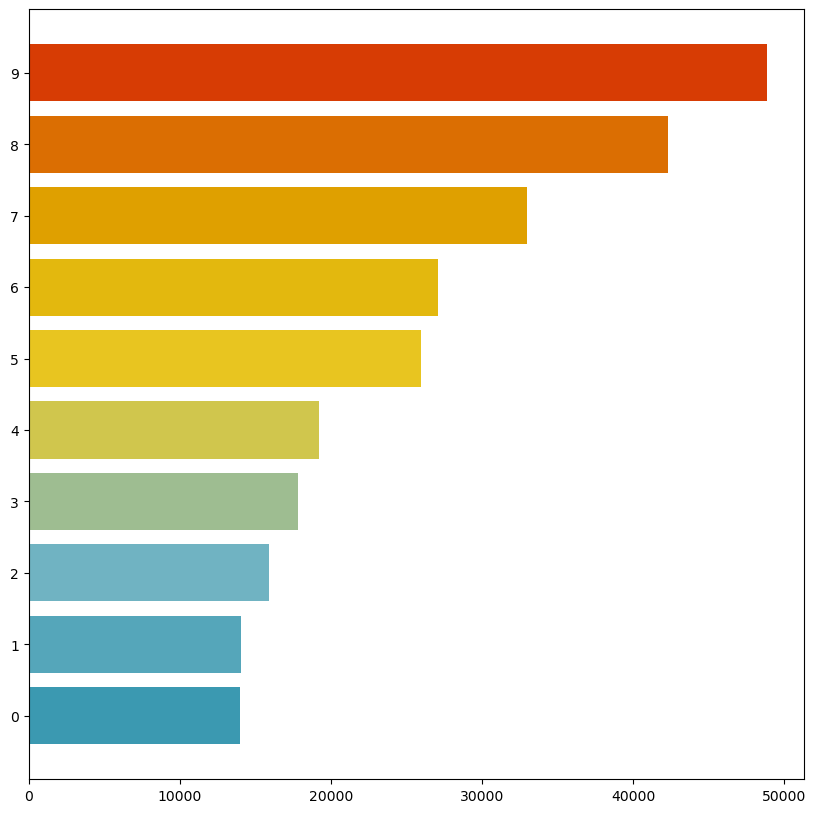

In [59]:
figsize=(10,10)
n_samples = 10
# adjust figsize based on number of samples, if not provided
if not figsize:
    figsize = (10, n_samples * 0.25)

fig, ax = plt.subplots(figsize=figsize)

cmap = spatial_plots.ColourMapGenerator().get_cmap("seq")(
    np.linspace(0, 1, n_samples)
)

ax.barh(
    range(len(sorted_importances[-n_samples:])),
    sorted_importances[-n_samples:],
    color=cmap,
)

# formatting
ax.set_yticks(range(n_samples))
# _ = ax.set_yticklabels(sorted_labels[-n_samples:])
# plt.xlabel("Importance")
# plt.ylabel("Feature")
# plt.grid(axis="x", linestyle="-", alpha=0.6)
# # plot minor gridlines
# plt.minorticks_on()
# plt.grid(axis="x", which="minor", linestyle="-0", alpha=0.2)